# Fulmine LABS mini-PACs

## Overview

Fulmine Labs will use medical images for various quality/testing related, machine learning (ML) initiatives. 
The best practice for managing this data is to use Digital Imaging and Communications in Medicine (DICOM) standard compliant images with a PACS-like system.

The code in this project implements and tests a basic PACS with the following architecture:

```

[ Orthanc Repository (Open Source component) ]
       |
       | (DICOM Images) <----------------------------------------->  [ OHIF Viewer (Open Source component) ]
       v
[ Fulmine-Labs-Mini-PACS - Data Setup Script ]      
       |								
       | (Metadata and generated images)   
       |                                          
[ SQLite Database ]							
       |								
       | (API Requests)						 
       v
[ Flask Application ]
       |
       | (HTTP Requests for Data)
       v
[ Client (Pytest, Browser) ]
       |
       | (Model Training Data)  [ Data Enhancements ]
       v
[ Fulmine-Labs-Mini-PACS - Data Setup Script ]
       |
       | (Data Enhancements)
       v
[ Anomaly Detection Model Training ]


```

The data setup script will traverse all folders in a specified location, identify DICOM images and if they have appropriate Window Center and Width DICOM header information, will convert them to PNG files at another specified location and add the related metadata to an SQLite database.

The database maintains the Patient -> Study -> Series -> Image relationship, as well as tracking the output image file names and parameters used in their creation, allowing PACS-like SQL queries to be constructed.

Currently supported endpoints (usually at http://127.0.0.1:5000) are:

'/' - welcome message
'/patients/<patient_id>' - get patient information
'/studies/<study_id>' - get study information
'/series/<series_id>' - get series information
'/images/<image_id>' - get image information
'/patients/<patient_id>/studies' - get studies for a patient
'/patients/<patient_id>/studycount' - get study count for a patient
'/patients/<patient_id>/seriescount' - get series count for a patient
'/patients/<patient_id>/imagecount' - get image count for a patient
'/patients/<patient_id>/counts' - get all counts for a patient
'/patients/count' - get total patient count
'/studies/count' - get total studies count
'/series/count' - get total series count
'/images/count' - get total images count
'/imageinfo/' - get image info by providing the file name
Once PNG images have been generated from the DICOM images, these are used as the basis of the 'valid' class in an ML image classifier. To reduce overfitting, additional images are generated and added to the valid class. These include:

The same images with random window centers and widths
The same images with light random blurring to simulate pixel interpolation or compression
The same images with flips and rotations
The same images zoomed in and out, also with random window centers and widths
The 'invalid' class will be comprised of, for example:

Non-medical images selected from the Kaggle 'real and fake' dataset
The same valid images as above with simulated error/message boxes in order to help to detect anomalous conditions
Some custom anomalous images, including AI-generated medical images
All of the images above will be distributed randomly between training, validation and testing folders in order to train and test the model. In addition, in order to test how well the model recognizes previously unseen medical images of the same type, some custom images will be selected from Google searches and used only for testing.

Overall the folder structure looks like this:

```

Orthanc (DICOM images)
  ├── subfolders

original training (PNG)
  ├──train
  ├──validate
  ├──test

Kaggle_real_and_fake_images (PNG)
  ├── subfolders

Custom_invalid (MIX)
  ├── subfolders

Custom_test_valid (from internet)

training_images
  ├──train
  │		├── valid
  │		│   ├── original training (dummy)
  │		│   ├── blurred
  │		│   └── window_leveled
  │	    │   └── rotate_and_flip
  │    	│   └── zoomed
  |     |     └── window_leveled
  │		└── invalid/
  │   		 	├── Kaggle_real_and_fake_images
  │    	 		└── copied from Custom_invalid
  ├──validate
  │		├── valid
  │		│   ├── original validate (dummy)
  │		│   ├── blurred
  │		│   ├── window_leveled
  │		│   ├── rotate_and_flip
  │		│   └── zoomed
  |     |     └── window_leveled
  │		└── invalid/
  │   		 	├── Kaggle_real_and_fake_images
  │    	 		└── copied from Custom_invalid
  ├──test
     ├──valid
     │  	├── original test (dummy)
     │		├── copied from Custom_test_valid
     └── invalid/
          	├── Kaggle_real_and_fake_images
           	└── copied from Custom_invalid

pairs_data
  ├──train_pairs.txt
  ├──validate_pairs.txt
  └──test_pairs.txt  

...

Once the data is prepare.
    (The functions below and data structure also support generating an image classifier model or encoder model).
 the Siam and weights are Netwo. Selected images are usedand reloaded and used to test those images seected for testing, producing metrics on Accuracy, Precision, Recall and F1 score.

## Author
Duncan Henderson
Fulmine Labs LLC

In [1]:
# For the image generation pipeline
import os
import random
from random import sample
import pydicom
import sqlite3
import shutil 
import logging
from datetime import datetime
import numpy as np
from PIL import Image, ImageDraw, ImageFont, ImageOps
import textwrap
from scipy.ndimage import gaussian_filter, rotate
from PIL import ImageFilter, Image
from itertools import combinations, product
import csv
from typing import List, Tuple


In [2]:
# Tensorflow version 2.16.1 has a bug with fit. Using 2.15.0 for now.
# Should be 2.15.0
import tensorflow as tf
print(tf.__version__)


2.15.0


In [3]:
# For training and testing the model
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Lambda
import tensorflow.keras.backend as K
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, precision_recall_curve
import scipy
from matplotlib import pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

In [4]:
# Test run variables

# Define a verbose flag (set it to True for verbose output)
#verbose = True
verbose = False

source_dir = r'D:\\Orthanc'
target_dir = r'D:\\training' # The output PNG files will be written to the same folder name with _images appended
training_ratio, validation_ratio = 0.7, 0.15

# Variables to control database and image deletion
delete_db = True
delete_images = True
db_path = 'medical_imaging.db'

# Image dimensions
img_width, img_height = 152, 152

# Training parameters
batch_size = 32
epochs = 50 # Can increase the epochs since early stopping will handle overfitting
threshold = 0.5
percentile = 95

# File name for saved model
siamese_network_model_name = 'lung_ct_siamese_network_model_042624.h5'
siamese_network_weights_name = 'lung_ct_siamese_network_weights_042624.h5'

# Percentage of images to apply message_boxes to
message_box_percentage = 100 

# Maximum number of images to process (needs to approximately balance the number of valid images)
max_invalid_images = 15000 
# Maximum number of custom invalid images to process
max_custom_invalid_images = 100 
# Maximum number of custom valid images to process
max_custom_valid_images = 100 

# How many zoom and window levelled images to create for each source image
number_of_zoom_and_wl_copies = 2
number_of_crop_copies = 2

# Attempting to find a seed that converges on useful models
seed_value = 42 # The answer to life the universe and everything

np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

In [5]:
# Append '_images' to the end of target_dir
training_images_dir = f"{target_dir}_images"

In [6]:
# Log to a log file that is specific for the test run and also to the screen if verbose is set

class CustomLogger:
    def __init__(self, verbose=False):
        self.verbose = verbose

        # Define log format to include date and time
        log_format = '%(asctime)s - %(levelname)s - %(message)s'
        log_filename = f'log_{datetime.now().strftime("%Y%m%d_%H%M%S")}.log'

        # Configure logging with UTF-8 encoding and specified log format
        logging.basicConfig(filename=log_filename, format=log_format, level=logging.INFO, encoding='utf-8', filemode='w', datefmt='%Y-%m-%d %H:%M:%S')

    def iprint(self, message):
        if self.verbose:
            print(message)
        logging.info(message)
        
    def eprint(self, message):
        print(message)
        logging.error(message)

In [7]:
def setup_database(db_path):

    logger.iprint ("In function setup_database")
    
    # Connect to SQLite database (this will create the database if it doesn't exist)
    
    try:
        conn = sqlite3.connect(db_path)
        cursor = conn.cursor()

        # Create tables
        cursor.execute('''CREATE TABLE IF NOT EXISTS Patients (
                            PatientID TEXT PRIMARY KEY,
                            PatientInfo TEXT);''')

        cursor.execute('''CREATE TABLE IF NOT EXISTS Studies (
                            StudyID TEXT PRIMARY KEY,
                            PatientID TEXT,
                            StudyDate TEXT,
                            StudyDescription TEXT,
                            BodyPartExamined TEXT,
                            FOREIGN KEY (PatientID) REFERENCES Patients (PatientID));''')

        cursor.execute('''CREATE TABLE IF NOT EXISTS Series (
                            SeriesID TEXT PRIMARY KEY,
                            StudyID TEXT,
                            SeriesDate TEXT,
                            SeriesDescription TEXT,
                            Modality TEXT,
                            FOREIGN KEY (StudyID) REFERENCES Studies (StudyID));''')
        
        cursor.execute('''CREATE TABLE IF NOT EXISTS Images (
                            ImageID TEXT PRIMARY KEY,
                            SeriesID TEXT,
                            FilePath TEXT,
                            State TEXT,
                            InstanceNumber TEXT,
                            FOREIGN KEY (SeriesID) REFERENCES Series (SeriesID));''')

        cursor.execute('''CREATE TABLE IF NOT EXISTS AugmentedImages (
                            AugmentedImageID INTEGER PRIMARY KEY AUTOINCREMENT,
                            ImageID TEXT,
                            PngFilePath TEXT,
                            Transformation TEXT,
                            WindowCenter TEXT,
                            WindowWidth TEXT,
                            RescaleIntercept TEXT,
                            RescaleSlope TEXT,
                            FOREIGN KEY (ImageID) REFERENCES Images (ImageID));''')
        conn.commit()
    except sqlite3.DatabaseError as e:
        print(f"Database error: {e}")
    finally:
        conn.close()

In [8]:
def is_dicom_file(file_path):

    logger.iprint ("In function is_dicom_file")
    
    try:
        pydicom.dcmread(file_path, stop_before_pixels=True)
        return True
    except Exception as e:
        logger.eprint(f"Error reading DICOM file {file_path}: {e}")
        return False

In [9]:
def clear_and_create_directory(directory):

    logger.iprint ("In function clear_and_create_directory")
    
    if os.path.exists(directory):
        shutil.rmtree(directory)
    os.makedirs(directory)

In [10]:
def copy_files(file_list, destination):

    logger.iprint ("In function copy_files ")
    
    try:
        os.makedirs(destination, exist_ok=True)
        for file_path in file_list:
            shutil.copy(file_path, os.path.join(destination, os.path.basename(file_path)))
    except (FileNotFoundError, PermissionError) as e:
        logger.eprint(f"File I/O error: {e}")

In [11]:
def extract_metadata(dicom_file_path):
    
    logger.iprint ("In function extract_metadata ")
    
    # Extract metadata like PatientID, StudyID, SeriesID, ImageID, Modality, and BodyPart
    ds = pydicom.dcmread(dicom_file_path, stop_before_pixels=True)
    patient_id = ds.PatientID
    study_id = ds.StudyInstanceUID
    series_id = ds.SeriesInstanceUID
    image_id = ds.SOPInstanceUID
    study_description = ds.StudyDescription if 'StudyDescription' in ds else 'N/A'
    series_description = ds.SeriesDescription if 'SeriesDescription' in ds else 'N/A'
    instance_number = ds.InstanceNumber if 'InstanceNumber' in ds else 'N/A'
    modality = ds.Modality if 'Modality' in ds else 'N/A'
    body_part_examined = ds.BodyPartExamined if 'BodyPartExamined' in ds else 'N/A'
    study_date = ds.StudyDate if 'StudyDate' in ds else 'N/A'
    series_date = ds.SeriesDate if 'SeriesDate' in ds else 'N/A'
 
    return patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date

In [12]:
def insert_metadata_into_db(cursor, patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date, file_path, state):
        
    logger.iprint ("In function insert_metadata_into_db")
    
    # Insert data into the Patients table
    cursor.execute("INSERT OR IGNORE INTO Patients (PatientID) VALUES (?)", (patient_id,))

    # Insert data into the Studies table
    cursor.execute("INSERT OR IGNORE INTO Studies (StudyID, PatientID, StudyDate, StudyDescription, BodyPartExamined) VALUES (?, ?, ?, ?, ?)",
                   (study_id, patient_id, study_date, study_description, body_part_examined))  # Replace "StudyDate" with actual values if needed

    # Insert data into the Series table
    cursor.execute("INSERT OR IGNORE INTO Series (SeriesID, StudyID, SeriesDate, SeriesDescription, Modality) VALUES (?, ?, ?, ?, ?)",
                   (series_id, study_id, series_date, series_description, modality))  # Replace "SeriesDate" with actual values if needed

    # Insert data into the Images table
    cursor.execute("INSERT OR IGNORE INTO Images (ImageID, SeriesID, FilePath, State, InstanceNumber) VALUES (?, ?, ?, ?, ?)", 
                   (image_id, series_id, file_path, state, instance_number))

In [13]:
def apply_rescale_and_window_level(dcm):
    """
    Apply the rescale slope and intercept, and window center and width to the DICOM image data.

    Parameters:
    - dcm: DICOM dataset.

    Returns:
    - rescaled_and_windowed_image: The image after applying rescale and window level.
    - window_center: Window center used for windowing.
    - window_width: Window width used for windowing.
    - rescale_slope: Rescale slope used for rescaling.
    - rescale_intercept: Rescale intercept used for rescaling.
    """
    
    logger.iprint ("In function apply_rescale_and_window_level")    
    
    # Apply rescale slope and intercept if available
    rescale_slope = getattr(dcm, 'RescaleSlope', 1)  # Default to 1 if not present
    rescale_intercept = getattr(dcm, 'RescaleIntercept', 0)  # Default to 0 if not present
    rescaled_image = dcm.pixel_array.astype(np.float64) * rescale_slope + rescale_intercept

    # Apply window center and width if available
    if hasattr(dcm, 'WindowCenter') and hasattr(dcm, 'WindowWidth'):
        window_center = dcm.WindowCenter
        window_width = dcm.WindowWidth
        if isinstance(window_center, pydicom.multival.MultiValue):
            window_center = window_center[0]
        if isinstance(window_width, pydicom.multival.MultiValue):
            window_width = window_width[0]
        window_center = float(window_center)
        window_width = float(window_width)

        low = window_center - window_width / 2
        high = window_center + window_width / 2
        rescaled_and_windowed_image = np.clip(rescaled_image, low, high)
    else:
        # If window level is not specified, use the rescaled image
        rescaled_and_windowed_image = rescaled_image
        window_center = None
        window_width = None

    return rescaled_and_windowed_image, window_center, window_width, rescale_slope, rescale_intercept

In [14]:
def normalize_image(image):
    
    logger.iprint ("In function normalize_image")    
    
    """Normalize the image data to 0-255 and convert to uint8."""
    image = image - np.min(image)
    image = image / np.max(image)
    image = (image * 255).astype(np.uint8)
    return image

In [15]:
def random_rotate_and_flip(image):
  
    logger.iprint ("In function random_rotate_and_flip")    
  
    try:
        # Convert PIL Image to numpy array for processing
        image_np = np.array(image)

        # Random rotation by 90, 180, or 270 degrees
        rotations = [0, 90, 180, 270]
        rotation_choice = random.choice(rotations)
        if rotation_choice != 0:
            image_np = np.rot90(image_np, rotation_choice // 90)  # np.rot90 expects k=1,2,3 for 90,180,270 degrees

        # Random flip
        if random.choice([True, False]):
            image_np = np.fliplr(image_np)
        if random.choice([True, False]):
            image_np = np.flipud(image_np)

        # Convert numpy array back to PIL Image
        rotated_and_flipped_image = Image.fromarray(image_np)

        return rotated_and_flipped_image
    except Exception as e:
        # Log the error or print it out
        logger.eprint("Error during rotation and flip: " + e)
        # Return the original image in case of error
        return image

In [16]:
def random_zoom(image):
     
    logger.iprint ("In function random_zoom")    
 
    # Randomly choose a zoom factor from 80% to 120%
    zoom_factor = random.uniform(0.8, 1.2)
    width, height = image.size
    
    # Calculate the new width and height based on the zoom factor
    new_width = int(width * zoom_factor)
    new_height = int(height * zoom_factor)
    
    # Resize the image
    resized_image = image.resize((new_width, new_height), Image.Resampling.LANCZOS)
    
    # If zooming out, pad the image with black pixels
    if zoom_factor < 1.0:
        delta_w = width - new_width
        delta_h = height - new_height
        padding = (delta_w // 2, delta_h // 2, delta_w - (delta_w // 2), delta_h - (delta_h // 2))
        return ImageOps.expand(resized_image, padding, fill=0)
    elif zoom_factor > 1.0:
        # If zooming in, crop the image to the original size
        return resized_image.crop(((new_width - width) // 2,
                                   (new_height - height) // 2,
                                   (new_width + width) // 2,
                                   (new_height + height) // 2))
    else:
        # If zoom_factor is 1, return the original image
        return image

In [17]:
def random_blur(image):
     
    logger.iprint ("In function random_blur")    
 
    # Randomly choose a blur radius from 0 to 5
    blur_radius = random.uniform(0, 5)
    
    # Apply Gaussian blur with the chosen radius
    blurred_image = image.filter(ImageFilter.GaussianBlur(blur_radius))
    
    return blurred_image

In [18]:
def construct_transformation_description(randomized_wl=False, blurred=False, rotate_and_flip=False, zoom=False, invert=False, crop=False):
    """
    Constructs a description of the transformations applied based on the given flags.
    
    Parameters:
    - randomized_wl: Boolean indicating if randomized window leveling was applied.
    - blurred: Boolean indicating if blur was applied.
    - rotate_and_flip: Boolean indicating if rotation/flipping was applied.
    - zoom: Boolean indicating if zoom was applied.
    - invert: Boolean indicating if inversion was applied.
    - crop: Boolean indicating if cropping was applied.
    
    Returns:
    - A string describing the applied transformations.
    """
    transformations = []
    if randomized_wl:
        transformations.append("randomized_wl")
    if blurred:
        transformations.append("blurred")
    if rotate_and_flip:
        transformations.append("rotate_and_flip")
    if zoom:
        transformations.append("zoomed")
    if invert:
        transformations.append("inverted")
    if crop:
        transformations.append("cropped")
    
    return ", ".join(transformations) if transformations else "none"

In [19]:
def random_window(image, min_level=-700, max_level=100, min_width=1200, max_width=2000):

    logger.iprint ("In function random_window")    
    
    window_level = random.randint(min_level, max_level)
    window_width = random.randint(min_width, max_width)

    img_min = window_level - window_width / 2
    img_max = window_level + window_width / 2
    windowed_img = np.clip(image, img_min, img_max)

    windowed_img -= windowed_img.min()
    windowed_img /= windowed_img.max()
    return windowed_img

In [20]:
def random_crop(pil_image):
    """
    Crop the image to a central square or rectangle with random borders between 5% and 25% of the image's dimensions.

    Parameters:
    - pil_image: The PIL Image to be cropped.

    Returns:
    - Cropped PIL Image.
    """
    width, height = pil_image.size
    maximum_crop = 0.30

    # Calculate the crop size
    left_margin = random.uniform(0.05, maximum_crop) * width
    right_margin = width - left_margin
    top_margin = random.uniform(0.05, maximum_crop) * height
    bottom_margin = height - top_margin

    # Define the cropping box
    crop_box = (left_margin, top_margin, right_margin, bottom_margin)

    # Crop the image
    cropped_image = pil_image.crop(crop_box)
    return cropped_image


In [21]:
def convert_dicom_to_png(dicom_dir, output_base_dir, state, cursor, randomized_wl=False, blurred=False, rotate_and_flip=False, zoom=False, invert=False, crop=False, num_images=1):
    """
    Converts DICOM images in a directory to PNG format, applying optional transformations.
    
    Parameters:
    - dicom_dir: Directory containing DICOM files.
    - output_base_dir: Base directory for output PNG files.
    - state: State of the image ('train', 'validate', or 'test').
    - cursor: Database cursor for logging transformations.
    - randomized_wl: Apply randomized window leveling.
    - blurred: Apply random blur.
    - rotate_and_flip: Apply random rotations and flips.
    - zoom: Apply random zoom.
    - invert: Invert colors.
    - crop: Apply semi-random cropping.
    - num_images: Number of images to generate per DICOM file.
    """
    
    logger.iprint("In function convert_dicom_to_png")

    try:
        output_dir = os.path.join(output_base_dir, 
                                  "zoomed" if zoom else "",
                                  "blurred" if blurred else "", 
                                  "randomized_wl" if randomized_wl else "",
                                  "rotate_and_flip" if rotate_and_flip else "",
                                  "inverted" if invert else "",
                                  "cropped" if crop else "")
        os.makedirs(output_dir, exist_ok=True)

        transformation_description = construct_transformation_description(randomized_wl, blurred, rotate_and_flip, zoom, invert, crop)

        for entry in os.listdir(dicom_dir):
            logger.iprint("Processing DICOM file: " + entry)
            dicom_path = os.path.join(dicom_dir, entry)

            if os.path.isfile(dicom_path):
                try:
                    dcm = pydicom.dcmread(dicom_path)
                    if not hasattr(dcm, 'PixelData'):
                        raise ValueError("DICOM file does not contain image pixel data")

                    for img_index in range(num_images):
                        rescaled_and_windowed_image, window_center, window_width, rescale_slope, rescale_intercept = apply_rescale_and_window_level(dcm)

                        normalized_image = normalize_image(rescaled_and_windowed_image)

                        pil_image = Image.fromarray(normalized_image.astype(np.uint8))

                        if zoom:
                            pil_image = random_zoom(pil_image)
                        if blurred:
                            pil_image = random_blur(pil_image)
                        if rotate_and_flip:
                            pil_image = random_rotate_and_flip(pil_image)
                        if invert:
                            pil_image = ImageOps.invert(pil_image)
                        if crop:
                            pil_image = random_crop(pil_image)  # Assuming this function is defined elsewhere

                        # Modify the filename to include the image index if num_images > 1
                        png_filename = f"{entry}_{img_index}.png" if num_images > 1 else f"{entry}.png"
                        png_path = os.path.join(output_dir, png_filename)
                        pil_image.save(png_path)

                        cursor.execute("INSERT INTO AugmentedImages (ImageID, PngFilePath, Transformation, WindowCenter, WindowWidth, RescaleIntercept, RescaleSlope) VALUES (?, ?, ?, ?, ?, ?, ?)",
                                       (dcm.SOPInstanceUID, png_path, transformation_description, window_center, window_width, rescale_intercept, rescale_slope))

                except Exception as e:
                    logger.iprint(f"Failed to convert: {dicom_path}, Error: {e}")
    except Exception as e:
        logger.eprint(f"Unexpected error: {e}")


In [22]:
def generate_error_message():

    logger.iprint ("In function generate_error_message")    

    base_messages = [
        "Lorem ipsum dolor sit amet, consectetur adipiscing elit.",
        "Error: The operation could not be completed.",
        "Warning: System memory is running low.",
        "Alert: Unrecognized device detected.",        
        "System failure: Please contact support.",
        "Update failed: Please retry or check your connection."
    ]
    # Select a base message randomly
    message = random.choice(base_messages)
    
    # Optionally append a random error code or numerical detail
    if random.choice([True, False]):  # Decide randomly whether to add a number
        number = random.randint(100, 9999)
        # Randomly choose how to add the number (end as a code or within the text)
        if random.choice([True, False]):
            message += f" Code: {number}."
        else:
            parts = message.split()
            insert_at = random.randint(1, len(parts) - 1)
            parts.insert(insert_at, str(number))
            message = ' '.join(parts)
    
    return message

In [23]:
def apply_error_message_box(image_path, output_path, font_paths, message_box_percentage):

    logger.iprint ("In function apply_error_message_box")    
    
    if random.randint(1, 100) > message_box_percentage:
        # Skip this image; do not apply message_box
        return

    image = Image.open(image_path).convert('L')  # Ensure image is in grayscale
    draw = ImageDraw.Draw(image)

    # Random font and size
    font_path = random.choice(font_paths)
    font_size = random.randint(15, 25)  # Adjust range as needed
    font = ImageFont.truetype(font_path, font_size)

    # Generate message
    message = generate_error_message()

    # Wrap the message
    wrapped_text = "\n".join(textwrap.wrap(message, width=40))

    # Calculate the bounding box for the wrapped text
    text_bbox = draw.textbbox((0, 0), wrapped_text, font=font)
    text_width = text_bbox[2] - text_bbox[0]
    text_height = text_bbox[3] - text_bbox[1]

    # Determine box size based on text dimensions, making box_height randomly larger
    box_width = max(text_width + 20, image.width // 4)  # Ensure minimum width and add padding
    # Randomize the height a bit more significantly
    box_height = random.randint(text_height + 20, int(1.5 * image.height // 4))

    # Randomly calculate the box position to fit within the image
    max_x = max(image.width - box_width, 0)
    max_y = max(image.height - box_height, 0)
    box_x = random.randint(0, max_x)
    box_y = random.randint(0, max_y)

    # Choose a random grayscale value for the box fill
    box_fill = random.randint(0, 255)
    # Use white text if the box is dark, black otherwise
    text_color = 255 if box_fill < 128 else 0

    # Draw the message box
    draw.rectangle([box_x, box_y, box_x + box_width, box_y + box_height], fill=box_fill)

    # Draw the text, left and top justified within the box
    # By starting the text at the top left corner of the box (with a little padding)
    text_start_x = box_x + 10  # Add some padding from the left edge
    text_start_y = box_y + 10  # Add some padding from the top edge
    draw.text((text_start_x, text_start_y), wrapped_text, fill=text_color, font=font, align='left')

    # Save the modified image
    image.save(output_path)

In [24]:
def augment_images_with_message_boxes(source_dir, output_dir, message_box_percentage, font_path="arial.ttf"):

    logger.iprint ("In function augment_images_with_message_boxes")    
    
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    all_images = os.listdir(source_dir)
    num_images_to_augment = int(len(all_images) * (message_box_percentage / 100.0))
    images_to_augment = random.sample(all_images, num_images_to_augment)
    logger.iprint ("Num images to add message boxes to: " + num_images_to_augment)

    for image_file in images_to_augment:
        logger.iprint (image_file)
        if image_file.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(source_dir, image_file)
            output_path = os.path.join(output_dir, "message_box_" + image_file)
            apply_error_message_box(image_path, output_path)

In [25]:
def copy_random_images(source_dir, target_dir, class_name, max_images=None, train_ratio=0.7, validate_ratio=0.15, test_ratio=0.15, subfolder_name=None):

    logger.iprint ("In function copy_random_images")    
  
    """
    Copies a random subset of images from the source directory to the train, validate, and test directories within the target directory.
    Each set will be placed in a subdirectory named after the specified class, and optionally, within a further specified subfolder.

    Parameters:
    - source_dir: The directory containing the original images.
    - target_dir: The base directory where the train, validate, and test directories will be created.
    - class_name: The class name (e.g., 'valid' or 'invalid') specifying the subdirectory within train, validate, and test where images should be copied.
    - max_images: The maximum number of images to copy. If None, all images in source_dir are considered.
    - train_ratio: The fraction of images to copy to the training set.
    - validate_ratio: The fraction of images to copy to the validation set.
    - test_ratio: The fraction of images to copy to the testing set.
    - subfolder_name: Optional name of a subfolder within each set directory where images will be copied.
    """
    
    # Ensure the ratios sum to 1
    assert train_ratio + validate_ratio + test_ratio == 1, "Ratios must sum to 1"
    
    # Recursively get all image filenames in the source directory and its subdirectories
    all_images = []
    for root, dirs, files in os.walk(source_dir):
        for file in files:
            
            if os.path.isfile(os.path.join(root, file)):
                all_images.append(os.path.join(root, file))
    
    if max_images is not None and max_images < len(all_images):
        all_images = sample(all_images, max_images)
    
    # Calculate the number of images for each set
    num_train = int(len(all_images) * train_ratio)
    num_validate = int(len(all_images) * validate_ratio)
    num_test = len(all_images) - num_train - num_validate
    
    # Randomly select images for each set
    train_images = sample(all_images, num_train)
    validate_images = sample([img for img in all_images if img not in train_images], num_validate)
    test_images = [img for img in all_images if img not in train_images + validate_images]
    
    def copy_images(images, target_subdir):
        if subfolder_name:
            target_subdir = os.path.join(target_subdir, subfolder_name)
        os.makedirs(target_subdir, exist_ok=True)
        for img_path in images:
            filename = os.path.basename(img_path)
            target_file_path = os.path.join(target_subdir, filename)
            if os.path.abspath(img_path) != os.path.abspath(target_file_path):
                shutil.copy(img_path, target_file_path)
    
    # Copy images to their respective directories
    copy_images(train_images, os.path.join(target_dir, f'train\\{class_name}'))
    copy_images(validate_images, os.path.join(target_dir, f'validate\\{class_name}'))
    copy_images(test_images, os.path.join(target_dir, f'test\\{class_name}'))

In [26]:
def apply_message_boxes_to_dataset(source_base_dir, output_base_dir, subset, font_paths, message_box_percentage):

    logger.iprint ("In function apply_message_boxes_to_dataset")    
    
    source_dir = os.path.join(source_base_dir, subset, 'valid')
    output_dir = os.path.join(output_base_dir, subset, 'invalid', 'message_boxes')
    
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    for image_file in os.listdir(source_dir):
        if image_file.endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(source_dir, image_file)
            output_path = os.path.join(output_dir, "message_box_" + image_file)
            apply_error_message_box(image_path, output_path, font_paths, message_box_percentage)


In [27]:
def is_dicom_file(file_path):
    
    logger.iprint ("In function is_dicom_file")    
    
    try:
        pydicom.dcmread(file_path, stop_before_pixels=True)
        return True
    except:
        return False

In [28]:
# Function to display the false negative image
def display_fn_image(image_path):
 
    logger.iprint ("In function display_fn_image") 
    
    image = load_img(image_path, color_mode='grayscale')
    plt.figure(figsize=(4, 4))
    plt.imshow(image, cmap='gray')
    plt.title("False Negative")
    plt.axis('off')
    plt.show()

In [29]:
# Function to display the false positive image
def display_fp_image(image_path):
     
    logger.iprint ("In function display_fp_image") 
    
    image = plt.imread(image_path)
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap='gray')
    plt.title("False Positive")
    plt.axis('off')
    plt.show()

In [30]:
def calculate_reconstruction_error(model, data_generator):
     
    logger.iprint ("In function calculate_reconstruction_error") 
    
    errors = []
    labels = []
    for batch in data_generator:
        images, batch_labels = batch
        reconstructions = model.predict(images)
        batch_errors = np.mean(np.square(images - reconstructions), axis=(1, 2, 3))
        errors.extend(batch_errors)
        labels.extend(batch_labels)
    return np.array(errors), np.array(labels)

In [31]:
def find_optimal_threshold(model, validate_generator):

    logger.iprint ("In function find_optimal_threshold") 
    
    # Calculate reconstruction errors and get true labels
    errors, labels = calculate_reconstruction_error(model, validate_generator)
    
    # Calculate precision, recall, and thresholds using sklearn
    precision, recall, thresholds = precision_recall_curve(labels, errors)
    
    # Calculate F1 scores from precision and recall
    f1_scores = 2 * (precision * recall) / (precision + recall)
    
    # Identify the index of the highest F1 score
    optimal_index = np.argmax(f1_scores)
    
    # Get the threshold that corresponds to the highest F1 score
    optimal_threshold = thresholds[optimal_index]
    
    return optimal_threshold

In [32]:
class CustomDataGenerator:
    def __init__(self, directory, batch_size, img_height, img_width):
        self.directory = directory
        self.batch_size = batch_size
        self.img_height = img_height
        self.img_width = img_width
        self.datagen = ImageDataGenerator(rescale=1./255)
        self.generator = self.datagen.flow_from_directory(
            directory=self.directory,
            target_size=(self.img_height, self.img_width),
            color_mode='grayscale',
            batch_size=self.batch_size,
            class_mode=None,  # Important for autoencoder, no labels
            shuffle=True
        )
        
        # Calculate total images by exploring the directory or using generator
        self.total_images = self.generator.samples

    def get_steps_per_epoch(self):
        # Calculate the steps per epoch
        steps_per_epoch = self.total_images // self.batch_size
        return steps_per_epoch

    def __next__(self):
        # Get the next batch from the underlying generator
        batch_x = next(self.generator)
        # Return it as input and target
        return batch_x, batch_x

    def __iter__(self):
        return self


In [33]:
def plot_test_pair_mismatches_with_paths(test_images_a, test_images_b, distances, actual_labels, threshold, pairs):

    logger.iprint ("In function plot_test_pair_mismatches_with_paths") 
    
    # Determine mismatches based on the threshold
    predicted_labels = (distances < threshold).astype(int)
    mismatches = [i for i, (pred, actual) in enumerate(zip(predicted_labels, actual_labels)) if pred != actual]

    mismatch_count = 0
    
    for i in mismatches:
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        
        axs[0].imshow(test_images_a[i].squeeze(), cmap='gray')
        axs[0].set_title(f"Image A\nPath: {pairs[i][0]}")
        axs[0].axis('off')
        
        axs[1].imshow(test_images_b[i].squeeze(), cmap='gray')
        predicted_label = 'Similar' if predicted_labels[i] == 1 else 'Dissimilar'
        actual_label = 'Similar' if actual_labels[i] == 1 else 'Dissimilar'
        axs[1].set_title(f"Image B\nPath: {pairs[i][1]}\nPredicted: {predicted_label} | Actual: {actual_label}")
        axs[1].axis('off')
        
        # Print the index and distance for the current mismatch
        print(f"Mismatch at Index: {i}, Distance: {distances[i]}, Predicted Label: {predicted_label}, Actual Label: {actual_label}")
        
        plt.show()
        mismatch_count += 1

    if mismatch_count == 0:
        print("No mismatches found.")
    else:
        print(f"Total Mismatches: {mismatch_count}")

In [34]:
def create_balanced_pairs(data_dir, output_file='pairs.txt'):

    logger.iprint ("In function create_balanced_pairs")
    
    valid_images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(os.path.join(data_dir, 'valid')) for f in filenames if os.path.splitext(f)[1].lower() in ['.png', '.jpg', '.jpeg']]
    invalid_images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(os.path.join(data_dir, 'invalid')) for f in filenames if os.path.splitext(f)[1].lower() in ['.png', '.jpg', '.jpeg']]
    
    # Determine the maximum number of pairs to create based on the smaller set
    max_pairs = min(len(valid_images), len(invalid_images))
    
    # Generate similar pairs (valid-valid and invalid-invalid)
    similar_pairs_valid = random.sample(list(combinations(valid_images, 2)), max_pairs // 2)
    similar_pairs_invalid = random.sample(list(combinations(invalid_images, 2)), max_pairs // 2)

    # Generate dissimilar pairs (valid-invalid)
    dissimilar_pairs = random.sample(list(product(valid_images, invalid_images)), max_pairs)

    # Combine similar and dissimilar pairs and shuffle them
    all_pairs = similar_pairs_valid + similar_pairs_invalid + dissimilar_pairs[:max_pairs]
    random.shuffle(all_pairs)

    # Save pairs to a file using comma as separator
    with open(output_file, 'w') as file:
        for pair in all_pairs:
            label = 1 if pair in similar_pairs_valid or pair in similar_pairs_invalid else 0
            file.write(f"{pair[0]},{pair[1]},{label}\n")

In [35]:
def contrastive_loss(y_true, y_pred):

    logger.iprint ("In function contrastive_loss")
    
    y_true = K.cast(y_true, 'float32')  # Ensure y_true is float32
    margin = 1.0
    square_pred = K.square(y_pred)
    margin_square = K.square(K.maximum(margin - y_pred, 0))
    return K.mean(y_true * square_pred + (1 - y_true) * margin_square)

In [36]:
def preprocess_image(img_path: str, target_size=(152, 152)):

    logger.iprint ("In function preprocess_image")
    
    #print(f"Attempting to open image: {img_path}")
    try:
        image = load_img(img_path, target_size=target_size, color_mode='grayscale')
        image = img_to_array(image)
        image /= 255.0  # Normalize to [0, 1]
    except FileNotFoundError as e:
        print(f"Failed to open image at {img_path}: {e}")
        return None
    return image

In [37]:
def move_images_to_dummy_class(directory):

    logger.iprint ("In function move_images_to_dummy_class")
    
    target_subdir = os.path.join(directory, "dummy_class")
    os.makedirs(target_subdir, exist_ok=True)
    
    # Move each file in the directory to the 'dummy_class' subdirectory
    for filename in os.listdir(directory):
        if filename.endswith(".png"):
            file_path = os.path.join(directory, filename)
            shutil.move(file_path, target_subdir)

In [38]:
def read_image_pairs(file_path: str) -> Tuple[List[Tuple[str, str]], List[int]]:

    logger.iprint ("In function read_image_pairs")
    
    pairs = []
    labels = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split(',')
            if len(parts) == 3:
                img_path_a, img_path_b, label_str = map(str.strip, parts)
                try:
                    label = int(label_str)
                    pairs.append((img_path_a, img_path_b))
                    labels.append(label)
                except ValueError as e:
                    print(f"Error parsing label from line: '{line.strip()}': {e}")
            else:
                print(f"Skipping invalid line: '{line.strip()}'")
    return pairs, labels

In [39]:
def euclidean_distance(vectors):

    logger.iprint ("In function euclidean_distance")
    
    """
    Computes the Euclidean distance between two vectors.
    """
    vector1, vector2 = vectors
    sum_square = K.sum(K.square(vector1 - vector2), axis=1, keepdims=True)
    return K.sqrt(K.maximum(sum_square, K.epsilon()))

In [40]:
def initialize_base_network(input_shape):

    logger.iprint ("In function initialize_base_networke")
    
    """
    Defines the base network for feature extraction.
    """
    input = Input(shape=input_shape)
    x = Conv2D(64, (3, 3), activation='relu')(input)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    return Model(input, x)

In [41]:
# Main code execution for image pipeline
# Currently supports only Siamese Network

logger = CustomLogger(verbose)

# Create an instance of the callback with your custom logger
#training_logger_callback = TrainingLoggerCallback(custom_logger)

# Check if the database exists and delete it if delete_db is True
if delete_db and os.path.exists(db_path):
    os.remove(db_path)
    logger.iprint("Existing database removed.")
else:
    logger.iprint("Skipping database removal.")

In [42]:
setup_database(db_path)

In [43]:
conn = sqlite3.connect(db_path)
cursor = conn.cursor()

In [44]:
# Stop here!
# Unless you want to re-create your image pipeline

if delete_images and (os.path.exists(target_dir) or os.path.exists(training_images_dir)):
    clear_and_create_directory(target_dir)
    clear_and_create_directory(training_images_dir)
    logger.iprint("Existing images removed.")
else:
    logger.iprint("Skipping image removal.")

In [45]:
# Copy the DICOM files from the image archive and add them to the database
dicom_files = []
for root, dirs, files in os.walk(source_dir):
    for file in files:
        file_path = os.path.join(root, file)
        if is_dicom_file(file_path):
            dicom_files.append(file_path)

random.shuffle(dicom_files)
total_files = len(dicom_files)
training_count = int(total_files * training_ratio)
validation_count = int(total_files * validation_ratio)

training_files = dicom_files[:training_count]
validation_files = dicom_files[training_count:training_count + validation_count]
test_files = dicom_files[training_count + validation_count:]

for file_path in training_files:
    patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date = extract_metadata(file_path)
    insert_metadata_into_db(cursor, patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date, file_path, 'train')

for file_path in validation_files:
    patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date = extract_metadata(file_path)
    insert_metadata_into_db(cursor, patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date, file_path, 'validate')

for file_path in test_files:
    patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date = extract_metadata(file_path)
    insert_metadata_into_db(cursor, patient_id, study_id, series_id, image_id, modality, body_part_examined, instance_number, study_description, series_description, study_date, series_date, file_path, 'test')

conn.commit()

copy_files(training_files, os.path.join(target_dir, 'train\\valid'))
copy_files(validation_files, os.path.join(target_dir, 'validate\\valid'))
copy_files(test_files, os.path.join(target_dir, 'test\\valid'))

logger.iprint(f"Total DICOM files: " + str(total_files))
logger.iprint(f"Training files: " + str(len(training_files)))
logger.iprint(f"Validation files: " + str(len(validation_files)))
logger.iprint(f"Test files: " + str(len(test_files)))


In [46]:
# After inserting DICOM metadata...
# Create the PNG files for training based on the DICOM tags
randomized_wl=False
blurred=False
rotate_and_flip=False
zoomed=False
invert=False
crop=False

convert_dicom_to_png(os.path.join(target_dir, 'train\\valid'), os.path.join(target_dir, '..', 'training_images', 'train', 'valid'), 'train', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
convert_dicom_to_png(os.path.join(target_dir, 'validate\\valid'), os.path.join(target_dir, '..', 'training_images', 'validate', 'valid'), 'validate', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
convert_dicom_to_png(os.path.join(target_dir, 'test\\valid'),os.path.join(target_dir, '..', 'training_images', 'test', 'valid'), 'test', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)

# Example usage
move_images_to_dummy_class('D:\\training_images\\train\\valid')
move_images_to_dummy_class('D:\\training_images\\validate\\valid')
move_images_to_dummy_class('D:\\training_images\\test\\valid')

conn.commit()

In [47]:
# # The PNGs have been created from the original DICOM images 
# # Now create copies of the same files with randomized window levels to reduce overfitting
# randomized_wl=True
# blurred=False
# rotate_and_flip=False
# zoomed=False
# invert=False
# crop=False

# convert_dicom_to_png(os.path.join(target_dir, 'train\\valid'), os.path.join(target_dir, '..', 'training_images', 'train', 'valid'), 'train', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
# convert_dicom_to_png(os.path.join(target_dir, 'validate\\valid'), os.path.join(target_dir, '..', 'training_images', 'validate', 'valid'), 'validate', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
# convert_dicom_to_png(os.path.join(target_dir, 'test\\valid'),os.path.join(target_dir, '..', 'training_images', 'test', 'valid'), 'test', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)

# conn.commit()

In [48]:
# # Now create copies of the same files with randomized blur to reduce overfitting
# from scipy.ndimage import gaussian_filter

# randomized_wl=False
# blurred=True
# rotate_and_flip=False
# zoomed=False
# invert=False
# crop=False

# convert_dicom_to_png(os.path.join(target_dir, 'train\\valid'), os.path.join(target_dir, '..', 'training_images', 'train', 'valid'), 'train', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
# convert_dicom_to_png(os.path.join(target_dir, 'validate\\valid'), os.path.join(target_dir, '..', 'training_images', 'validate', 'valid'), 'validate', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
# convert_dicom_to_png(os.path.join(target_dir, 'test\\valid'),os.path.join(target_dir, '..', 'training_images', 'test', 'valid'), 'test', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)

# conn.commit()


In [49]:
# # Now create copies of the same files with randomized rotation and flipping

# randomized_wl=False
# blurred=False
# rotate_and_flip=True
# zoomed=False
# invert=False
# crop=False

# convert_dicom_to_png(os.path.join(target_dir, 'train\\valid'), os.path.join(target_dir, '..', 'training_images', 'train', 'valid'), 'train', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
# convert_dicom_to_png(os.path.join(target_dir, 'validate\\valid'), os.path.join(target_dir, '..', 'training_images', 'validate', 'valid'), 'validate', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)
# convert_dicom_to_png(os.path.join(target_dir, 'test\\valid'),os.path.join(target_dir, '..', 'training_images', 'test', 'valid'), 'test', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop)

# conn.commit()

In [50]:
# Now create copies of the same files with the centers cropped to enable comparison of the center of images without the text overlays (and simulate some internet studies)

randomized_wl=True
blurred=False
rotate_and_flip=False
zoomed=False
invert=False
crop=True

convert_dicom_to_png(os.path.join(target_dir, 'train\\valid'), os.path.join(target_dir, '..', 'training_images', 'train', 'valid'), 'train', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop, number_of_crop_copies)
convert_dicom_to_png(os.path.join(target_dir, 'validate\\valid'), os.path.join(target_dir, '..', 'training_images', 'validate', 'valid'), 'validate', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop, number_of_crop_copies)
convert_dicom_to_png(os.path.join(target_dir, 'test\\valid'),os.path.join(target_dir, '..', 'training_images', 'test', 'valid'), 'test', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop, number_of_crop_copies)

conn.commit()

In [51]:
# Now create copies of the same files with randomized zoom as well as window level (to simulate some internet studies)
from scipy.ndimage import gaussian_filter

randomized_wl=True
blurred=False
rotate_and_flip=False
zoomed=True
invert=False
crop=False

convert_dicom_to_png(os.path.join(target_dir, 'train\\valid'), os.path.join(target_dir, '..', 'training_images', 'train', 'valid'), 'train', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop, number_of_zoom_and_wl_copies)
convert_dicom_to_png(os.path.join(target_dir, 'validate\\valid'), os.path.join(target_dir, '..', 'training_images', 'validate', 'valid'), 'validate', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop, number_of_zoom_and_wl_copies)
convert_dicom_to_png(os.path.join(target_dir, 'test\\valid'),os.path.join(target_dir, '..', 'training_images', 'test', 'valid'), 'test', cursor, randomized_wl, blurred, rotate_and_flip, zoomed, invert, crop, number_of_zoom_and_wl_copies)

conn.commit()

In [52]:
# Copy some random custom valid images (from internet sources) for testing only
source_dir = 'D:\\Custom_test_valid'
copy_random_images(source_dir, training_images_dir, 'valid', max_custom_valid_images, 0, 0, 1, "InternetTest")

In [53]:
# Database updates complete
conn.close()

In [54]:
# Copy some random invalid Kaggle real and fake images
source_dir = 'D:\\Kaggle_real_and_fake_images'
copy_random_images(source_dir, training_images_dir, 'invalid', max_invalid_images)

In [55]:
# Copy some random custom invalid images
source_dir = 'D:\\Custom_invalid'
copy_random_images(source_dir, training_images_dir, 'invalid', max_custom_invalid_images)

In [56]:
# Add message_boxes to images
# Note: In this case we are reusing images already selected for training, validation and test
# a better approach might be to use images that were not selected

font_paths = ['arial.ttf', 'times.ttf']  # Add paths to any other fonts you'd like to use

# Apply message_boxes to each dataset subset
for subset in ['train', 'validate', 'test']:
    apply_message_boxes_to_dataset(training_images_dir, training_images_dir, subset, font_paths, message_box_percentage)

In [57]:
import os
import shutil

pairs_dir = 'd:\\pairs_data'

# Check if the directory exists
if os.path.exists(pairs_dir):
    # If it exists, remove the directory and its contents
    shutil.rmtree(pairs_dir)

# Then, recreate the directory
os.makedirs(pairs_dir)

In [58]:
# May get a 'memory error' if too many valid images or other large memory hog processes running
create_balanced_pairs('d:\\training_images\\test', output_file='d:\\pairs_data\\test_pairs.txt')
create_balanced_pairs('d:\\training_images\\validate', output_file='d:\\pairs_data\\validate_pairs.txt')
create_balanced_pairs('d:\\training_images\\train', output_file='d:\\pairs_data\\train_pairs.txt')

In [59]:
# **********************
# Train the Siamese Network model
    
train_pairs, train_labels = read_image_pairs('d:\\pairs_data\\train_pairs.txt')
val_pairs, val_labels = read_image_pairs('d:\\pairs_data\\validate_pairs.txt')
test_pairs, test_labels = read_image_pairs('d:\\pairs_data\\test_pairs.txt')

In [60]:
# Simplified and with debugging for train_images_a and train_images_b
train_images_a = []
train_images_b = []

for pair in train_pairs:
    img_a_path = pair[0]
    img_b_path = pair[1]
    img_a = preprocess_image(img_a_path)
    img_b = preprocess_image(img_b_path)
    train_images_a.append(img_a)
    train_images_b.append(img_b)

# Convert lists to numpy arrays after all images have been processed and added
train_images_a = np.array(train_images_a)
train_images_b = np.array(train_images_b)

In [61]:
# Simplified and with debugging for validate_images_a and validate_images_b
validate_images_a = []
validate_images_b = []

for pair in val_pairs:
    img_a_path = pair[0]
    img_b_path = pair[1]
    img_a = preprocess_image(img_a_path)
    img_b = preprocess_image(img_b_path)
    validate_images_a.append(img_a)
    validate_images_b.append(img_b)

# Convert lists to numpy arrays after all images have been processed and added
validate_images_a = np.array(validate_images_a)
validate_images_b = np.array(validate_images_b)

In [62]:
# Simplified and with debugging for test_images_a and test_images_b
test_images_a = []
test_images_b = []

for pair in test_pairs:
    #print("Debugging pair:", pair)  # To see the pair structure
    img_a_path = pair[0]
    img_b_path = pair[1]
    #print("Processing image A path:", img_a_path)  # To confirm the path is correct
    #print("Processing image B path:", img_b_path)  # To confirm the path is correct
    img_a = preprocess_image(img_a_path)
    img_b = preprocess_image(img_b_path)
    test_images_a.append(img_a)
    test_images_b.append(img_b)

# Convert lists to numpy arrays after all images have been processed and added
test_images_a = np.array(test_images_a)
test_images_b = np.array(test_images_b)

In [63]:
train_images_a = np.array(train_images_a).astype('float32')
train_images_b = np.array(train_images_b).astype('float32')
train_labels = np.array(train_labels).astype('float32')

In [64]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Path to save the model file
checkpoint_filepath = 'checkpoint_model.h5'

# EarlyStopping callback to stop training when the validation loss does not improve
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=5,          # Number of epochs with no improvement after which training will be stopped
    verbose=1,
    restore_best_weights=True  # Restores model weights from the epoch with the best value of the monitored metric
)

# ModelCheckpoint callback to save the model at the epoch with the best value of the monitored metric
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_loss',  
    verbose=1,
    save_best_only=True,  # Only save a model if `val_loss` has improved
    mode='min'            # The `val_loss` should minimize
)

In [65]:
print(train_images_a.shape, train_images_b.shape, train_labels.shape)

(20052, 152, 152, 1) (20052, 152, 152, 1) (20052,)


In [66]:
import tensorflow as tf

# Define the architecture for the Siamese network
input_shape = (152, 152, 1)
base_network = initialize_base_network(input_shape)

input_a = Input(shape=input_shape)
input_b = Input(shape=input_shape)

processed_a = base_network(input_a)
processed_b = base_network(input_b)

distance = Lambda(euclidean_distance)([processed_a, processed_b])

model = Model([input_a, input_b], distance)

# Compile model
model.compile(optimizer='adam', loss=contrastive_loss, metrics=['accuracy'])

# Assuming your data is already loaded and split into train_images_a, train_images_b, train_labels, etc.

# Correct dataset creation for training data
train_dataset = tf.data.Dataset.from_tensor_slices((
    (train_images_a, train_images_b),  # Inputs in a tuple
    train_labels  # Outputs
)).batch(128)

# Correct dataset creation for validation data
val_dataset = tf.data.Dataset.from_tensor_slices((
    (validate_images_a, validate_images_b),  # Validation inputs in a tuple
    val_labels  # Validation outputs
)).batch(128)

# Now, use the dataset in the .fit() method
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=val_dataset,
    callbacks=[early_stopping, model_checkpoint]
)




Epoch 1/30
Cause: Unable to locate the source code of <function normcase at 0x00000283CEF582C0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: Unable to locate the source code of <function normcase at 0x00000283CEF582C0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the 

C:\Users\Duncan\anaconda3\envs\Eyball\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


157/157 [==============================] - 1015s 6s/step - loss: 0.8240 - accuracy: 0.1087 - val_loss: 0.0391 - val_accuracy: 0.0323
Epoch 2/30
157/157 [==============================] - ETA: 0s - loss: 0.0307 - accuracy: 0.0267
Epoch 2: val_loss improved from 0.03908 to 0.03720, saving model to checkpoint_model.h5
157/157 [==============================] - 1048s 7s/step - loss: 0.0307 - accuracy: 0.0267 - val_loss: 0.0372 - val_accuracy: 0.0233
Epoch 3/30
157/157 [==============================] - ETA: 0s - loss: 0.0209 - accuracy: 0.0143
Epoch 3: val_loss improved from 0.03720 to 0.03254, saving model to checkpoint_model.h5
157/157 [==============================] - 1041s 7s/step - loss: 0.0209 - accuracy: 0.0143 - val_loss: 0.0325 - val_accuracy: 0.0162
Epoch 4/30
157/157 [==============================] - ETA: 0s - loss: 0.0153 - accuracy: 0.0080
Epoch 4: val_loss improved from 0.03254 to 0.02988, saving model to checkpoint_model.h5
157/157 [==============================] - 1036s 

In [67]:
# Save the model
model.save(siamese_network_model_name)

In [68]:
# AS reloading the model has issues try saving the weights
model.save_weights(siamese_network_weights_name)

In [69]:
# 'base_network' is your trained base network model

# Compute embeddings for both sets of images in each pair
embeddings_a = base_network.predict(test_images_a)
embeddings_b = base_network.predict(test_images_b)

# Calculate Euclidean distances between embeddings
distances = np.sqrt(np.sum(np.square(embeddings_a - embeddings_b), axis=1))

# Determine a threshold for deciding between similar and dissimilar
threshold = np.mean(distances)  # Example heuristic
print("Threshold for determining similarity:", threshold)

# Predict similarities (1 if distance below threshold, else 0)
predictions = (distances < threshold).astype(int)

# Initialize a list to store indices of false negatives identified in the loop
identified_false_negatives_indices = []

# Debugging: Print detailed information for each index and collect false negative indices
for index, (distance, pred, actual) in enumerate(zip(distances, predictions, test_labels)):
    is_fn = pred == 0 and actual == 1  # Identifying false negatives
    if is_fn:
        identified_false_negatives_indices.append(index)  # Add the index to the list
        print(f"Index: {index}, Distance: {distance:.4f}, Prediction: {pred}, Actual Label: {actual}, Is False Negative: {is_fn}")

# Now, use `identified_false_negatives_indices` instead of `false_negatives_indices` for further analysis
false_negatives_count = len(identified_false_negatives_indices)

# Compute evaluation metrics
accuracy = accuracy_score(test_labels, predictions)
precision = precision_score(test_labels, predictions)
recall = recall_score(test_labels, predictions)
f1 = f1_score(test_labels, predictions)

# Logging metrics and false negative count
logger.iprint(f'Siamese network Accuracy: {accuracy}')
logger.iprint(f'Siamese network Precision: {precision}')
logger.iprint(f'Siamese network Recall: {recall}')
logger.iprint(f'Siamese network F1 Score: {f1}')
logger.iprint(f'False Negatives detected by Siamese Network: {false_negatives_count}')


140/140 [==============================] - 29s 207ms/step
Threshold for determining similarity: 0.617956
Index: 190, Distance: 0.9179, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 376, Distance: 1.0795, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 821, Distance: 1.1038, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 948, Distance: 0.6501, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 964, Distance: 0.6907, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 994, Distance: 0.9508, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 1219, Distance: 1.0235, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 1432, Distance: 1.1087, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 1434, Distance: 0.6867, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 1619, Distance: 0.6528, Prediction: 0, Actual Label: 1, Is False Negative: True
Index: 1924, Distance: 0.8762, 

Mismatch at Index: 22, Distance: 0.0, Predicted Label: Similar, Actual Label: Dissimilar


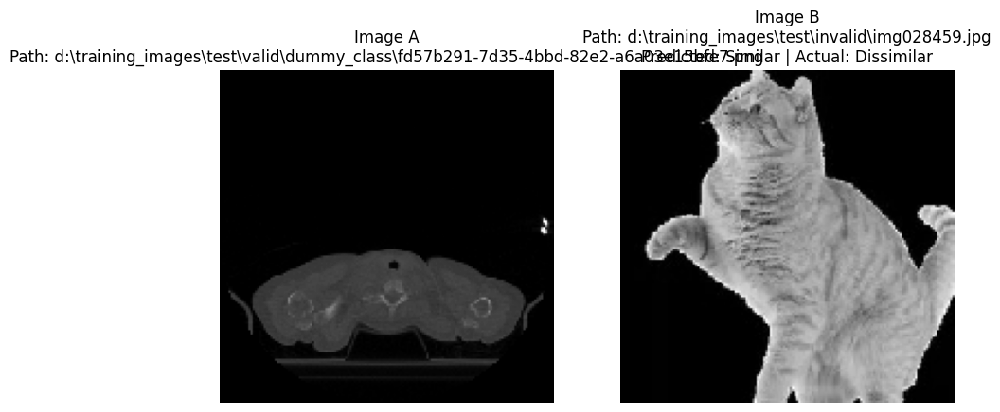

Mismatch at Index: 146, Distance: 0.47714781761169434, Predicted Label: Similar, Actual Label: Dissimilar


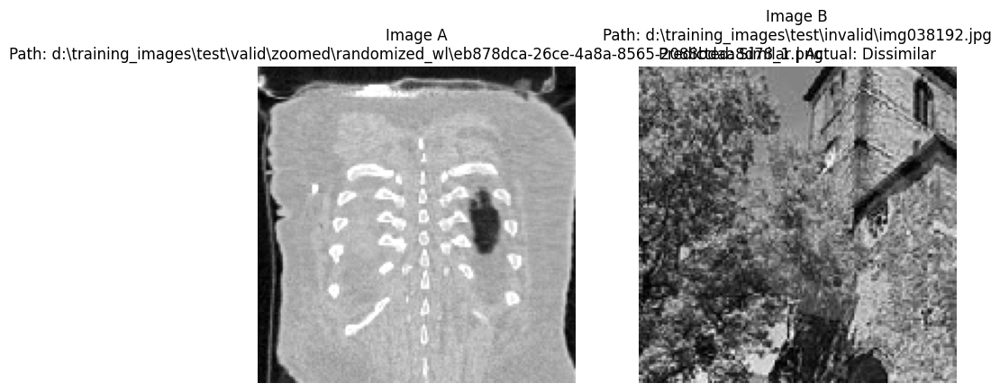

Mismatch at Index: 190, Distance: 0.9178550243377686, Predicted Label: Dissimilar, Actual Label: Similar


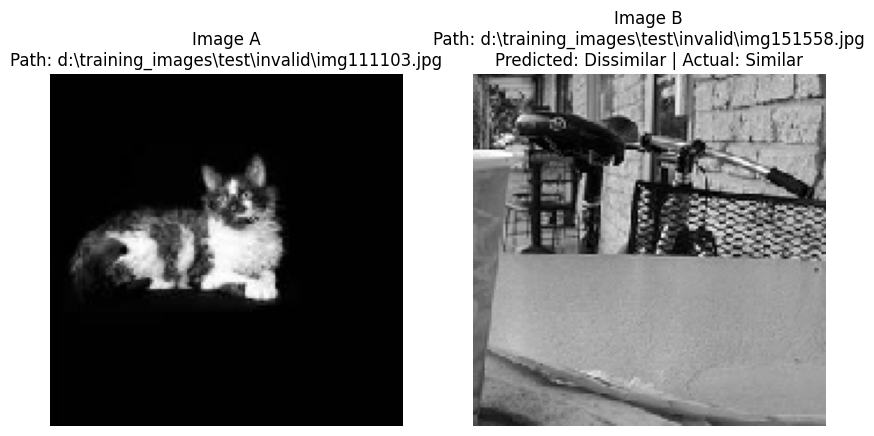

Mismatch at Index: 225, Distance: 0.23771697282791138, Predicted Label: Similar, Actual Label: Dissimilar


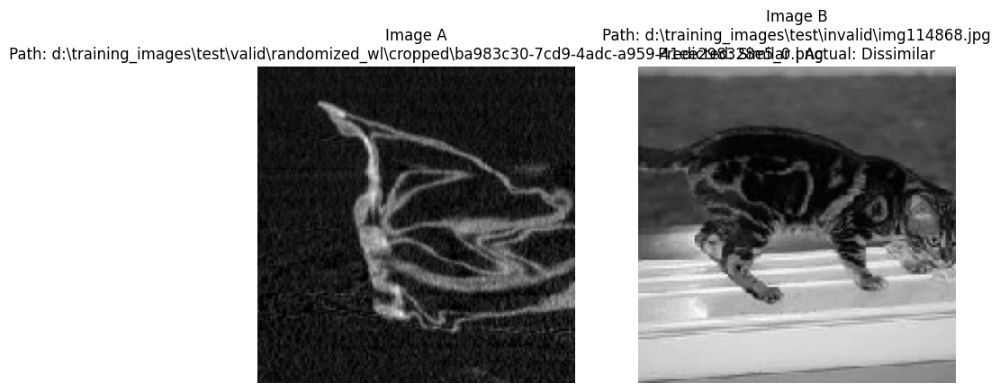

Mismatch at Index: 349, Distance: 0.5945249795913696, Predicted Label: Similar, Actual Label: Dissimilar


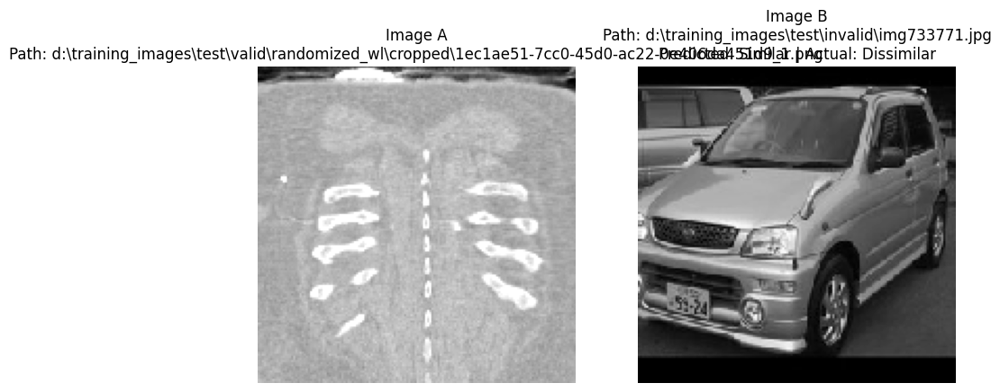

Mismatch at Index: 376, Distance: 1.079467535018921, Predicted Label: Dissimilar, Actual Label: Similar


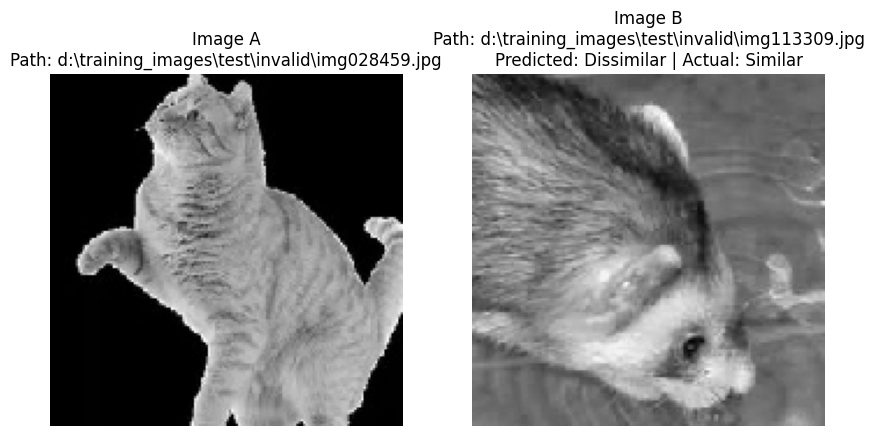

Mismatch at Index: 433, Distance: 0.4193345308303833, Predicted Label: Similar, Actual Label: Dissimilar


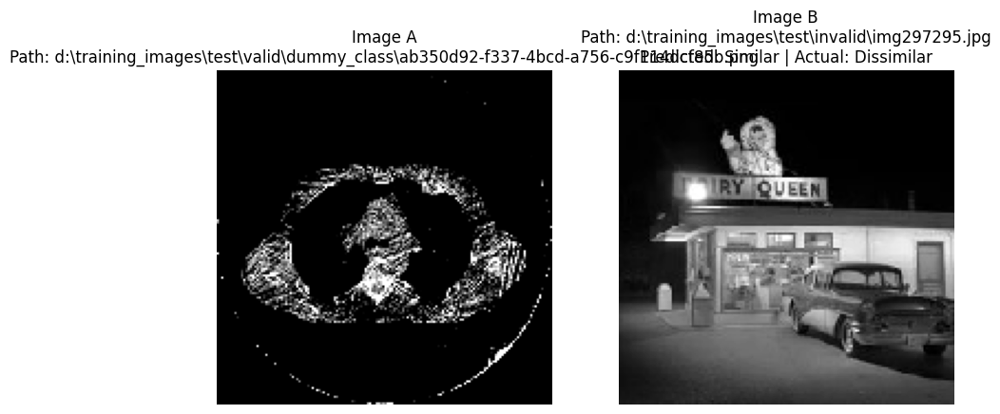

Mismatch at Index: 577, Distance: 0.25623762607574463, Predicted Label: Similar, Actual Label: Dissimilar


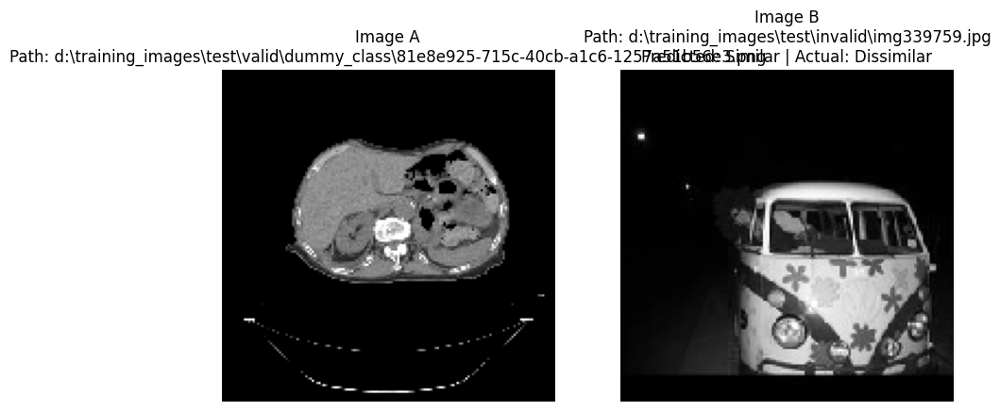

Mismatch at Index: 592, Distance: 0.3387462794780731, Predicted Label: Similar, Actual Label: Dissimilar


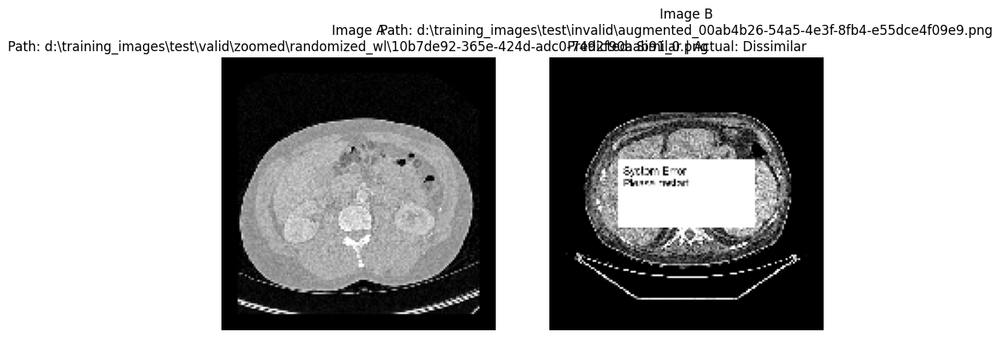

Mismatch at Index: 658, Distance: 0.5885562896728516, Predicted Label: Similar, Actual Label: Dissimilar


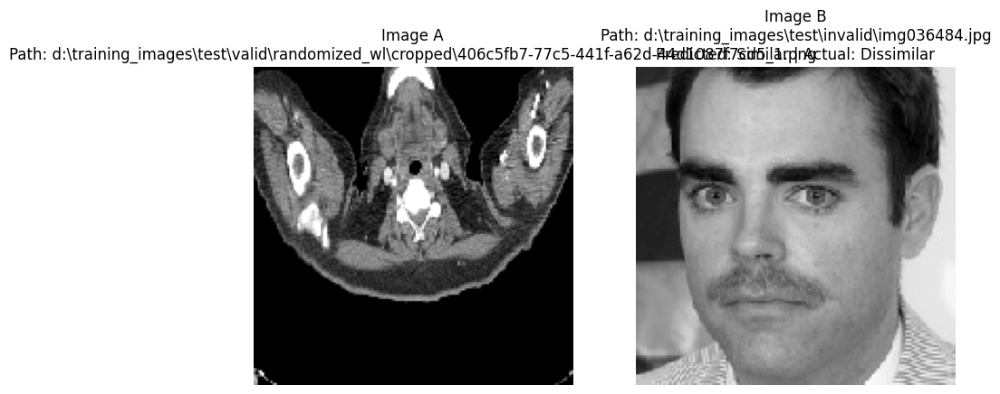

Mismatch at Index: 733, Distance: 0.0, Predicted Label: Similar, Actual Label: Dissimilar


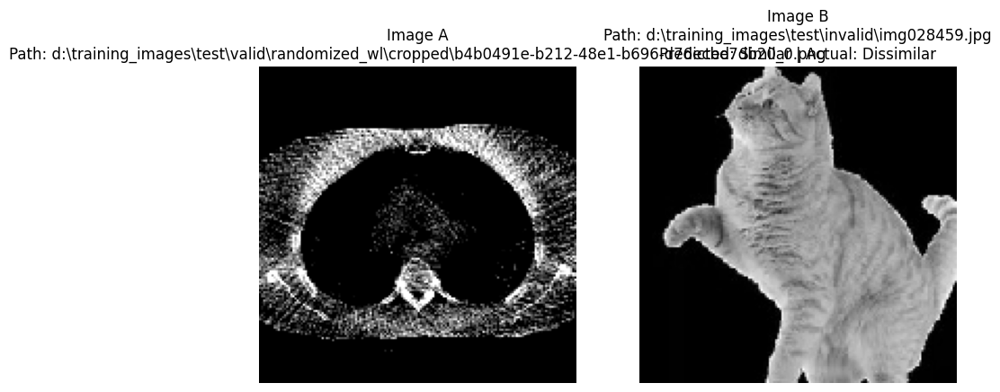

Mismatch at Index: 821, Distance: 1.103804349899292, Predicted Label: Dissimilar, Actual Label: Similar


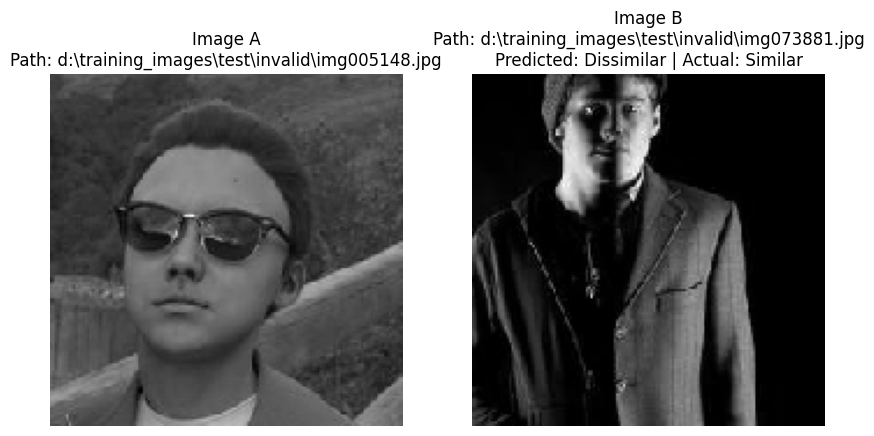

Mismatch at Index: 847, Distance: 0.2971729636192322, Predicted Label: Similar, Actual Label: Dissimilar


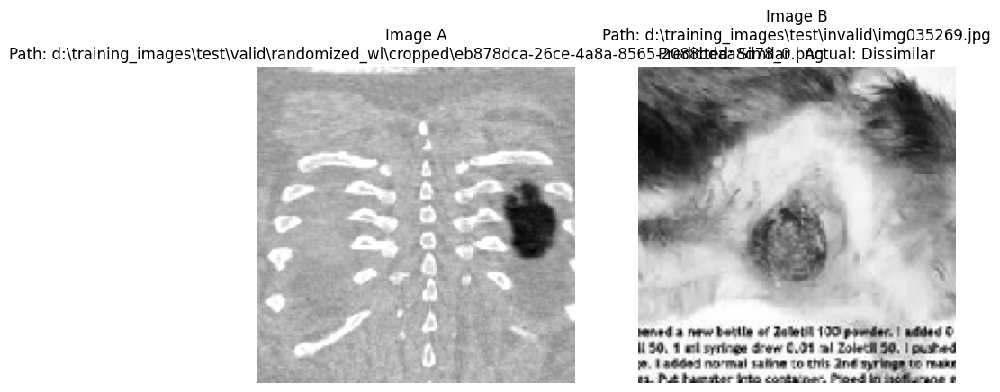

Mismatch at Index: 854, Distance: 0.5695168972015381, Predicted Label: Similar, Actual Label: Dissimilar


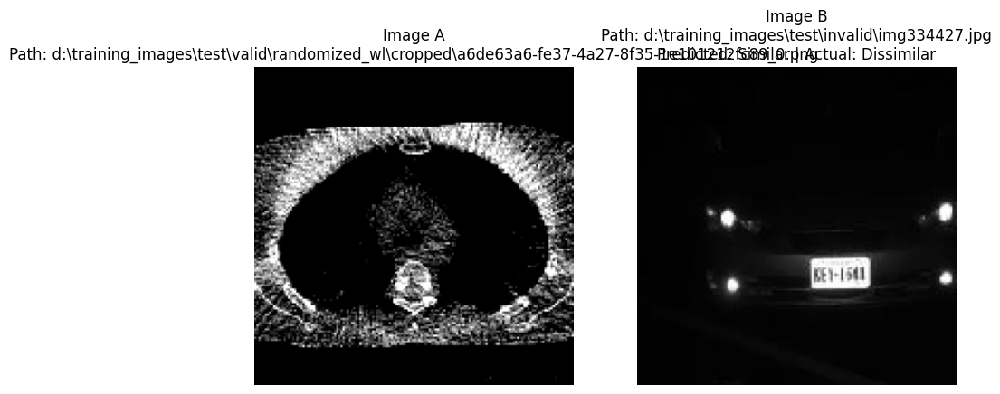

Mismatch at Index: 948, Distance: 0.6501240730285645, Predicted Label: Dissimilar, Actual Label: Similar


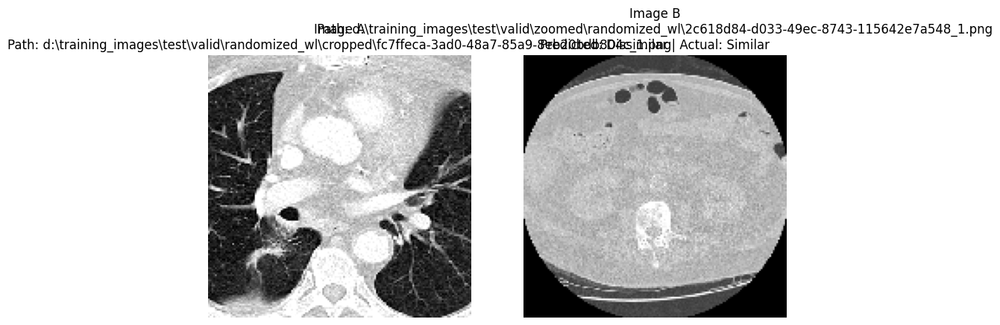

Mismatch at Index: 964, Distance: 0.690725564956665, Predicted Label: Dissimilar, Actual Label: Similar


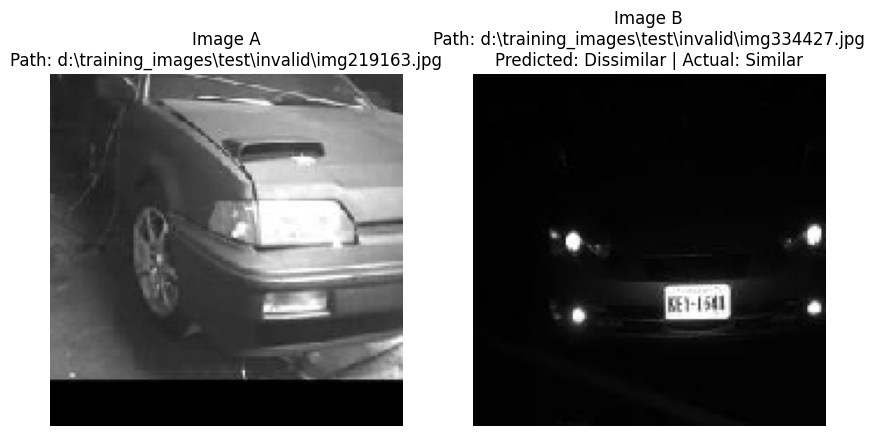

Mismatch at Index: 994, Distance: 0.9507743716239929, Predicted Label: Dissimilar, Actual Label: Similar


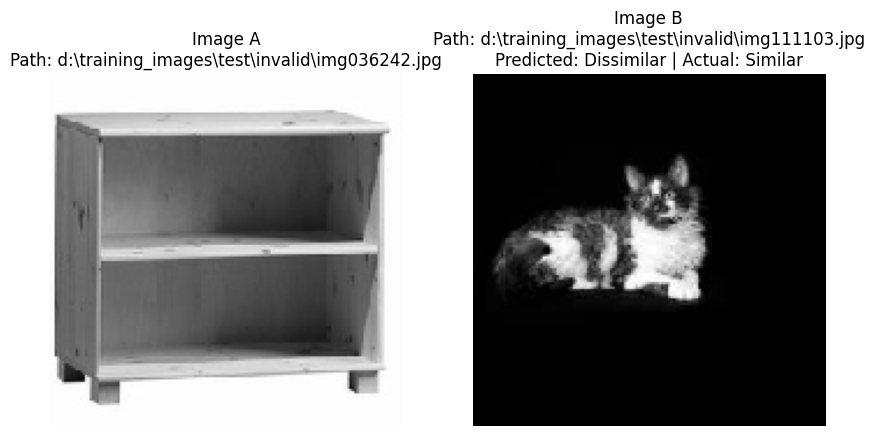

Mismatch at Index: 1151, Distance: 0.20657123625278473, Predicted Label: Similar, Actual Label: Dissimilar


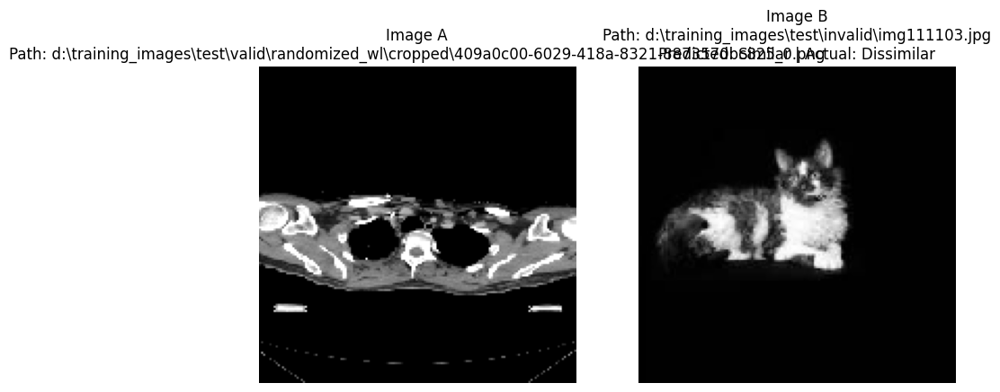

Mismatch at Index: 1219, Distance: 1.0235074758529663, Predicted Label: Dissimilar, Actual Label: Similar


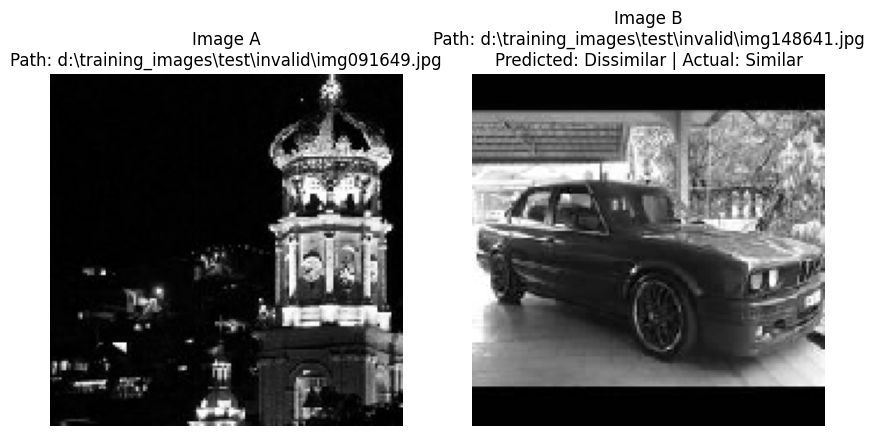

Mismatch at Index: 1285, Distance: 0.606035053730011, Predicted Label: Similar, Actual Label: Dissimilar


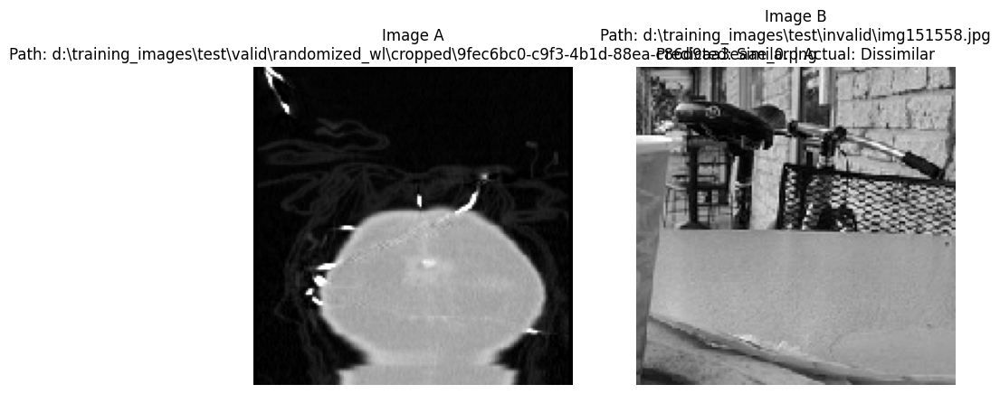

Mismatch at Index: 1348, Distance: 0.2909114956855774, Predicted Label: Similar, Actual Label: Dissimilar


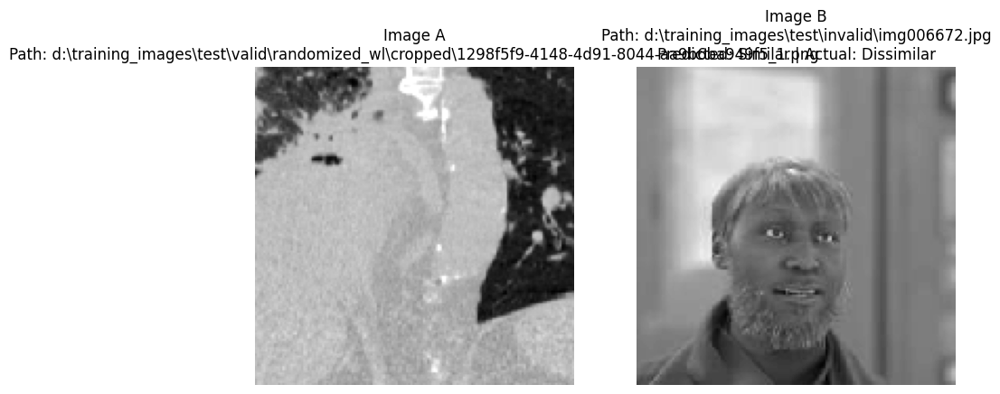

Mismatch at Index: 1432, Distance: 1.1087474822998047, Predicted Label: Dissimilar, Actual Label: Similar


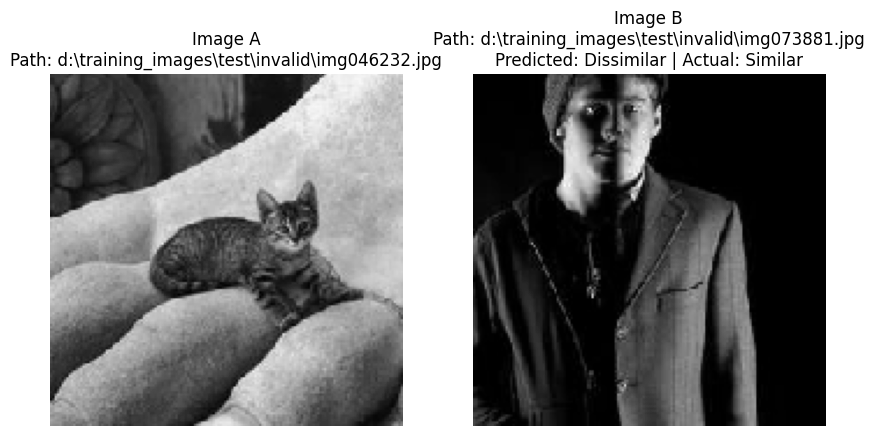

Mismatch at Index: 1434, Distance: 0.6866520643234253, Predicted Label: Dissimilar, Actual Label: Similar


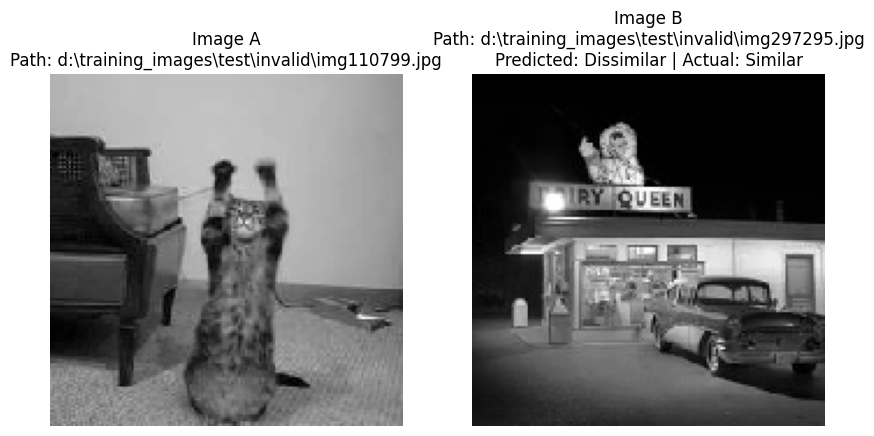

Mismatch at Index: 1619, Distance: 0.6527663469314575, Predicted Label: Dissimilar, Actual Label: Similar


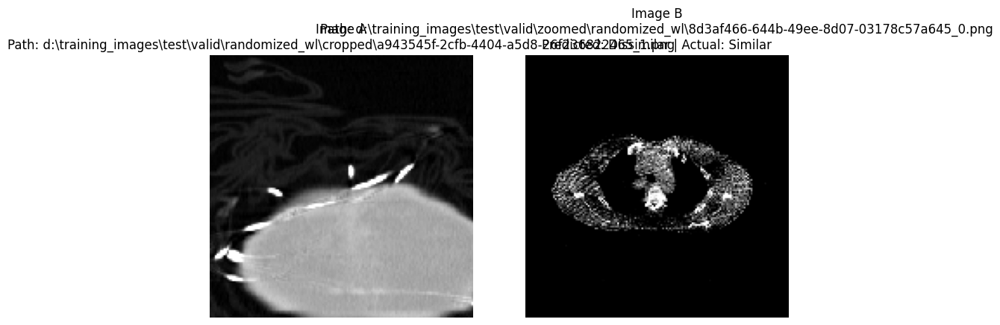

Mismatch at Index: 1770, Distance: 0.43813443183898926, Predicted Label: Similar, Actual Label: Dissimilar


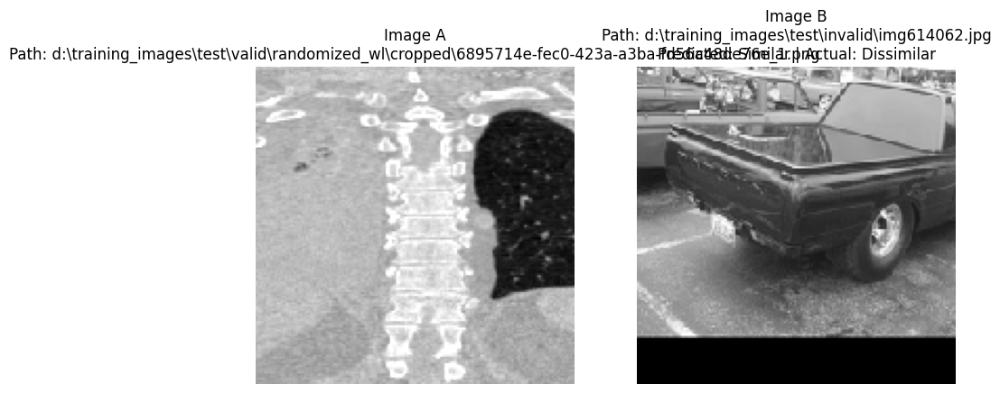

Mismatch at Index: 1798, Distance: 0.5085006952285767, Predicted Label: Similar, Actual Label: Dissimilar


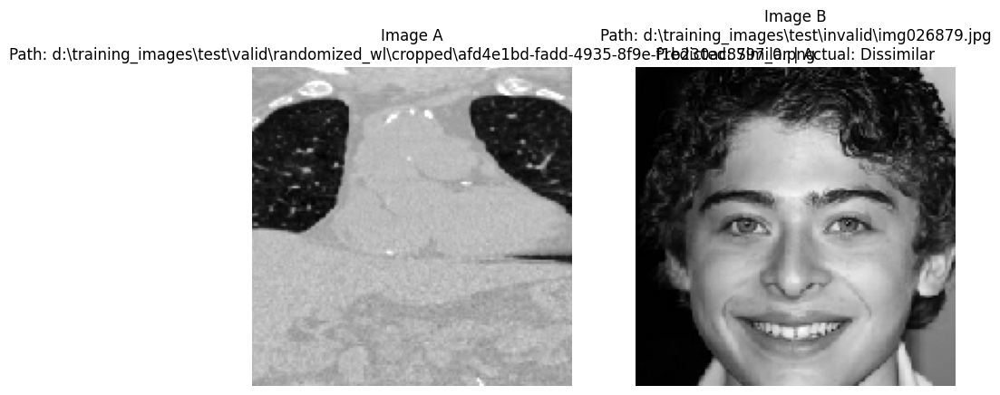

Mismatch at Index: 1924, Distance: 0.8761696815490723, Predicted Label: Dissimilar, Actual Label: Similar


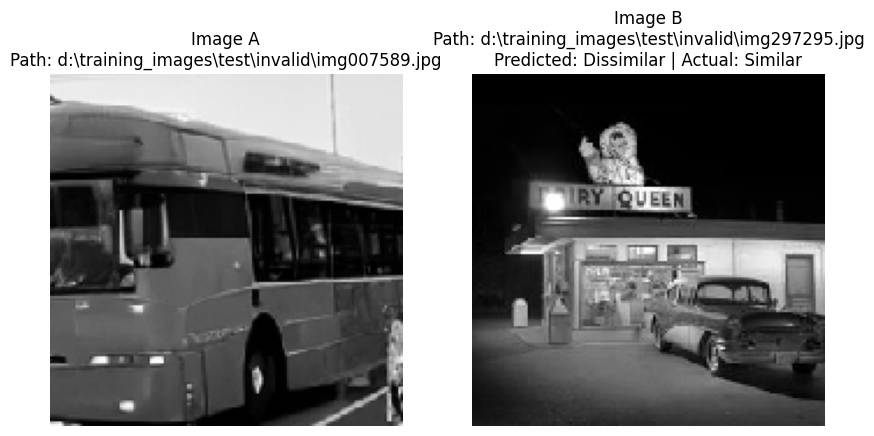

Mismatch at Index: 1999, Distance: 0.6271305084228516, Predicted Label: Dissimilar, Actual Label: Similar


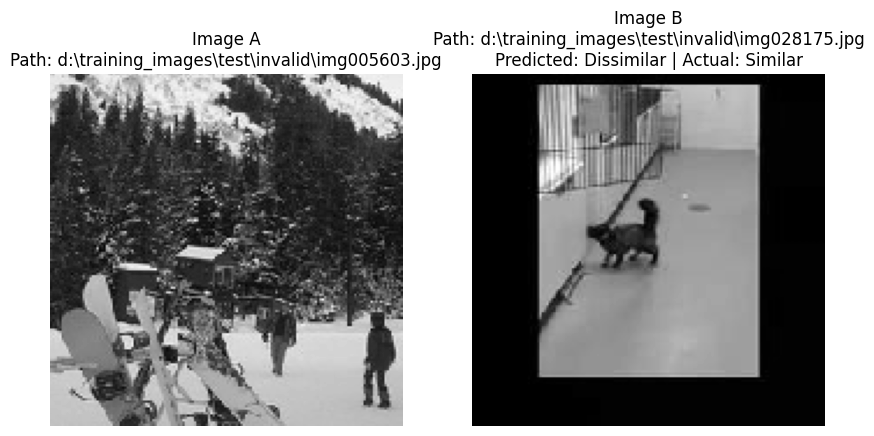

Mismatch at Index: 2041, Distance: 1.074610710144043, Predicted Label: Dissimilar, Actual Label: Similar


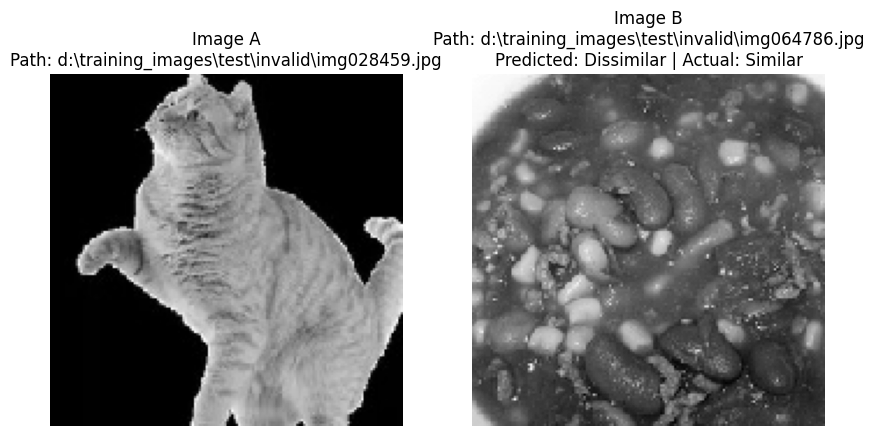

Mismatch at Index: 2050, Distance: 0.470855712890625, Predicted Label: Similar, Actual Label: Dissimilar


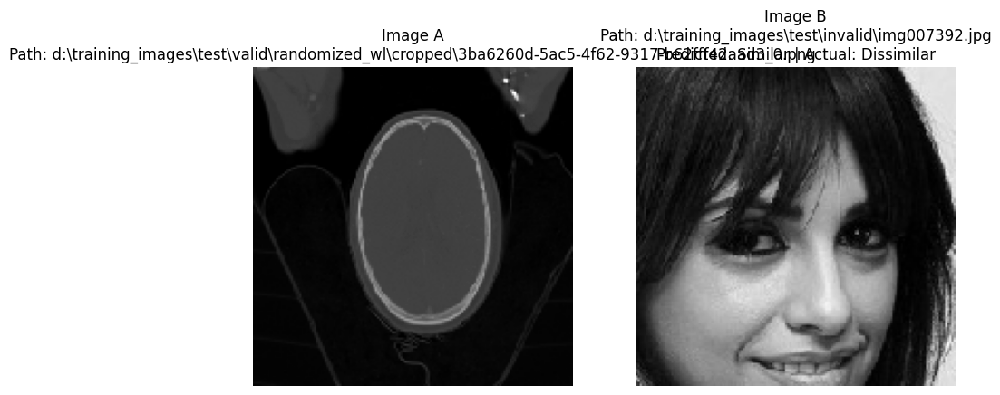

Mismatch at Index: 2058, Distance: 0.4193345308303833, Predicted Label: Similar, Actual Label: Dissimilar


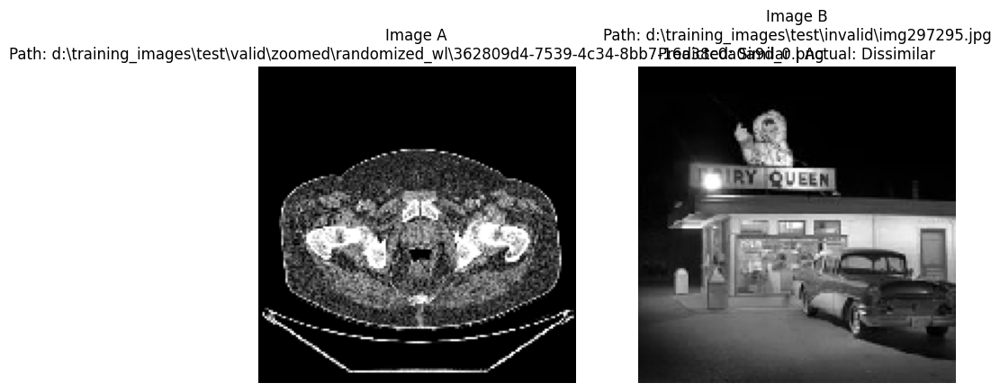

Mismatch at Index: 2084, Distance: 0.3387462794780731, Predicted Label: Similar, Actual Label: Dissimilar


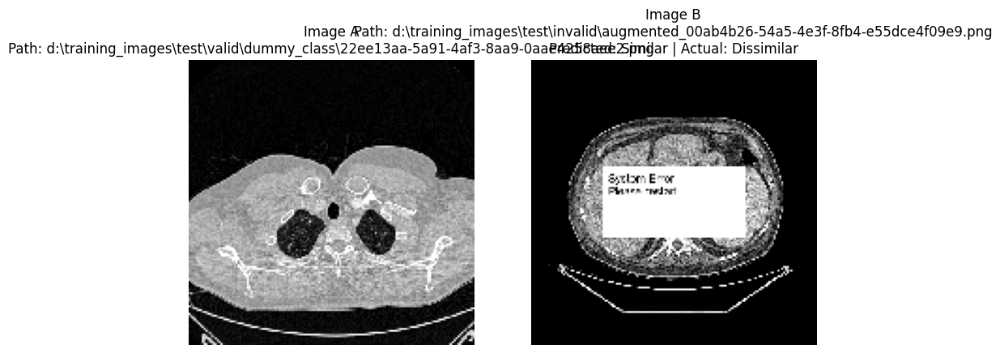

Mismatch at Index: 2136, Distance: 0.8269227147102356, Predicted Label: Dissimilar, Actual Label: Similar


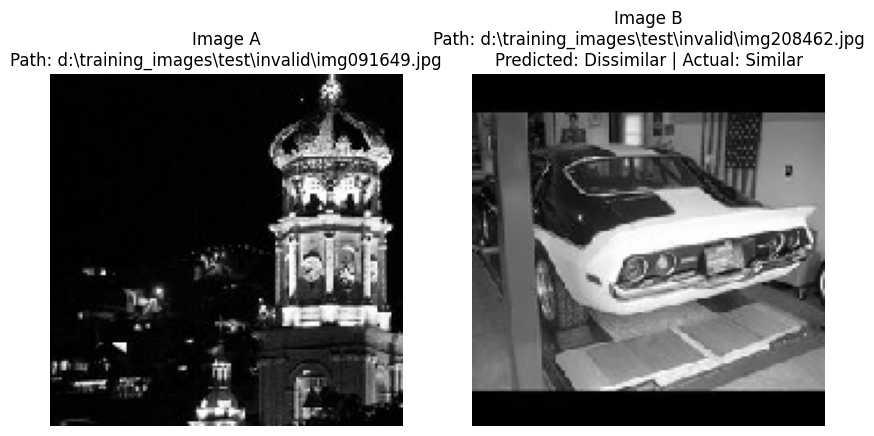

Mismatch at Index: 2254, Distance: 0.596672534942627, Predicted Label: Similar, Actual Label: Dissimilar


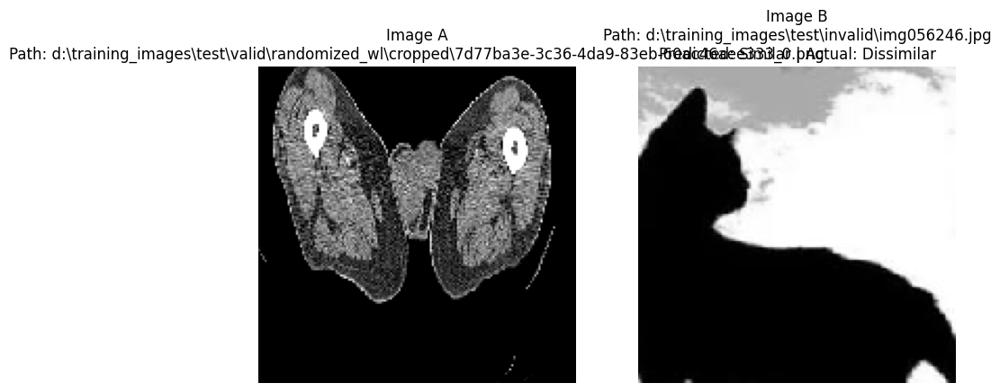

Mismatch at Index: 2265, Distance: 0.44554388523101807, Predicted Label: Similar, Actual Label: Dissimilar


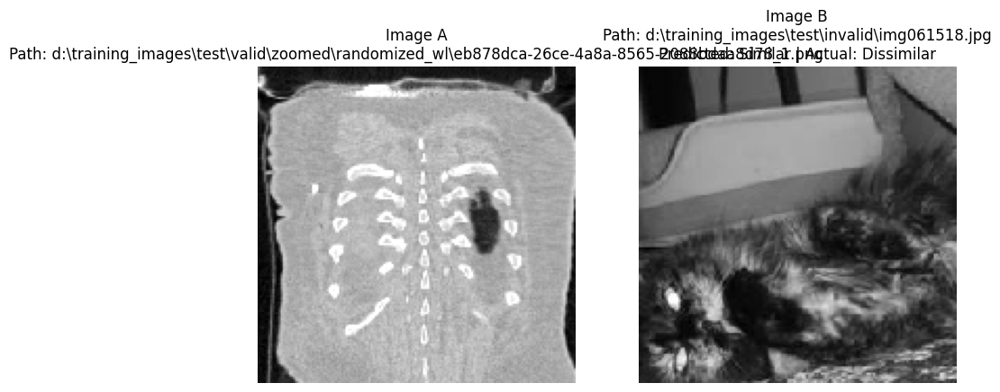

Mismatch at Index: 2504, Distance: 0.5904479622840881, Predicted Label: Similar, Actual Label: Dissimilar


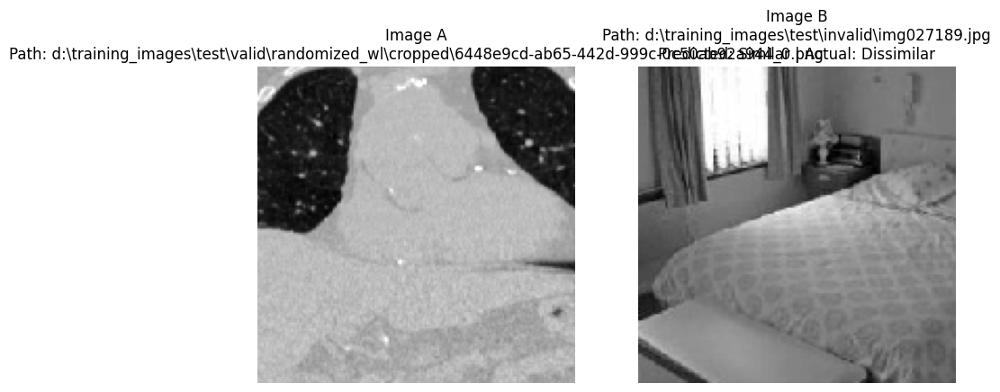

Mismatch at Index: 2586, Distance: 0.6726946234703064, Predicted Label: Dissimilar, Actual Label: Similar


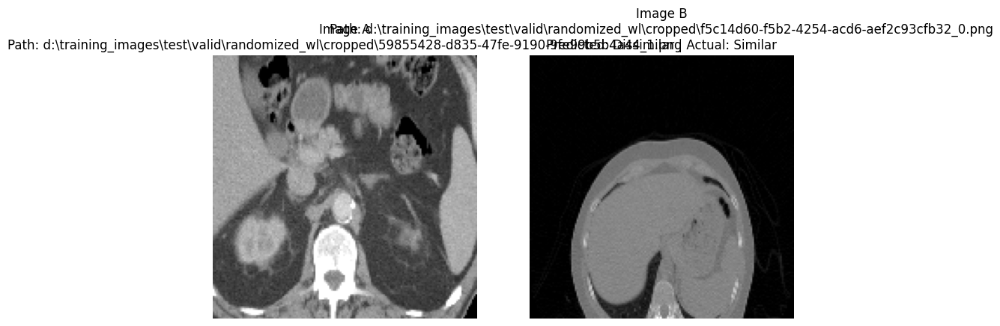

Mismatch at Index: 2712, Distance: 0.6005387902259827, Predicted Label: Similar, Actual Label: Dissimilar


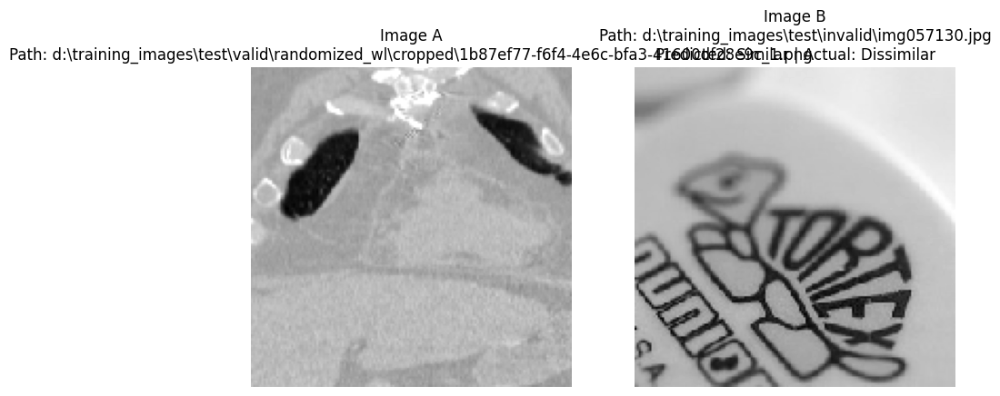

Mismatch at Index: 2747, Distance: 0.3625880479812622, Predicted Label: Similar, Actual Label: Dissimilar


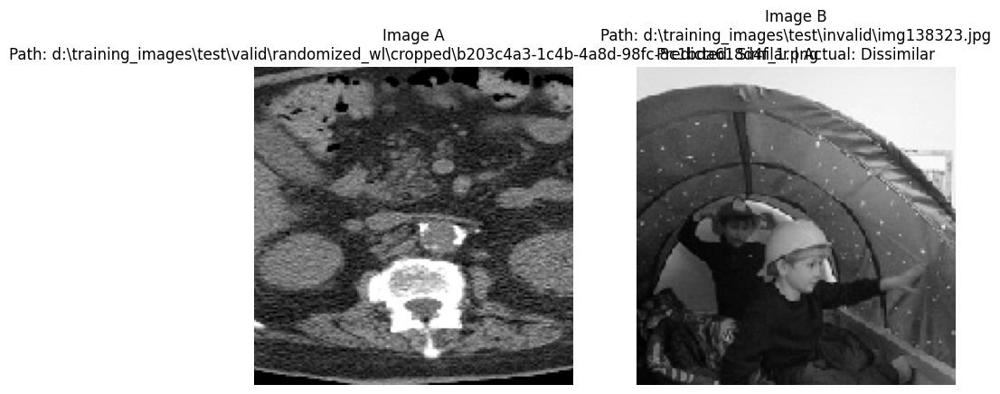

Mismatch at Index: 2794, Distance: 0.0733812153339386, Predicted Label: Similar, Actual Label: Dissimilar


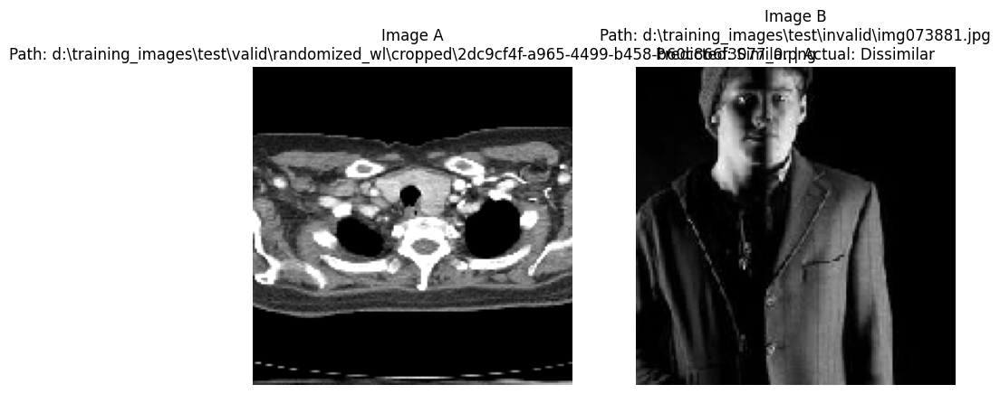

Mismatch at Index: 2870, Distance: 0.9092776775360107, Predicted Label: Dissimilar, Actual Label: Similar


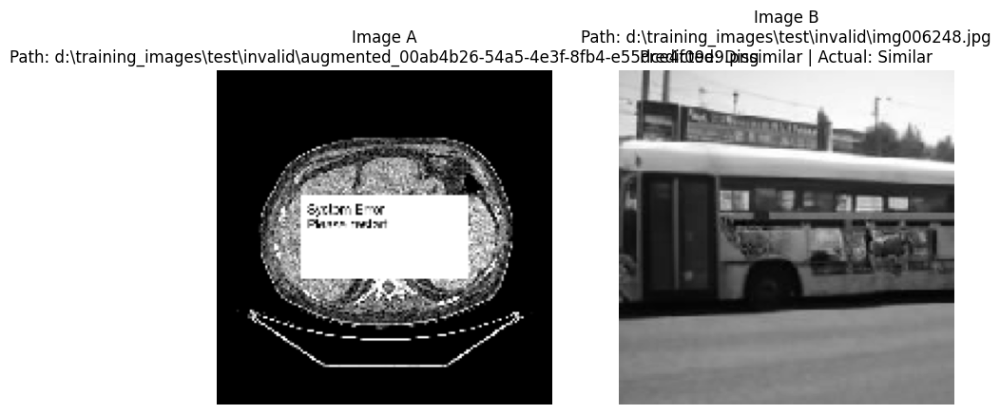

Mismatch at Index: 2922, Distance: 0.6868400573730469, Predicted Label: Dissimilar, Actual Label: Similar


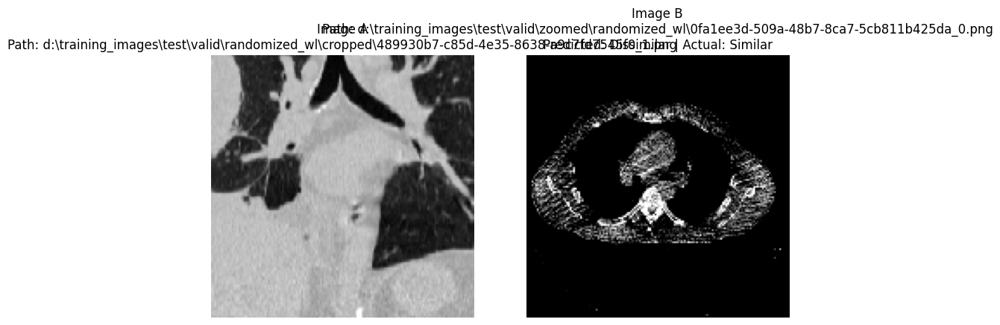

Mismatch at Index: 2932, Distance: 0.9182543158531189, Predicted Label: Dissimilar, Actual Label: Similar


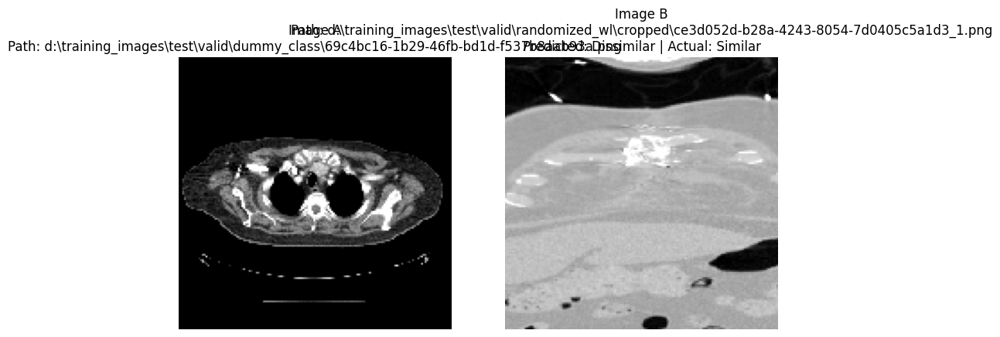

Mismatch at Index: 3068, Distance: 0.586443305015564, Predicted Label: Similar, Actual Label: Dissimilar


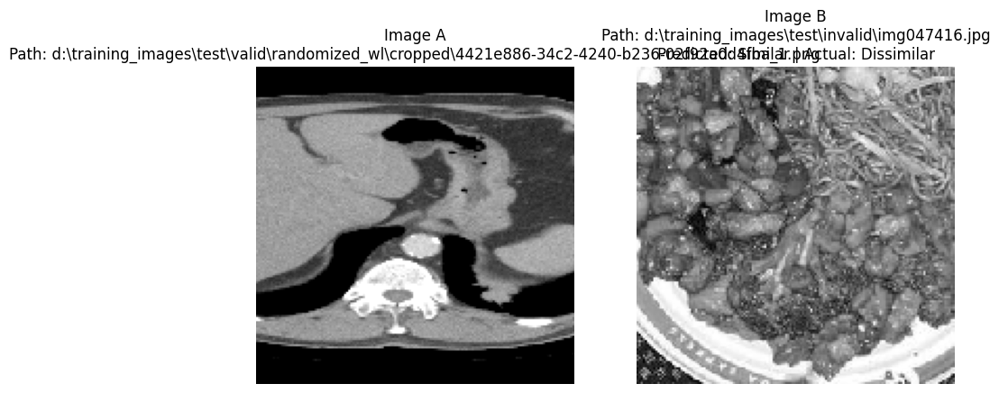

Mismatch at Index: 3080, Distance: 0.0, Predicted Label: Similar, Actual Label: Dissimilar


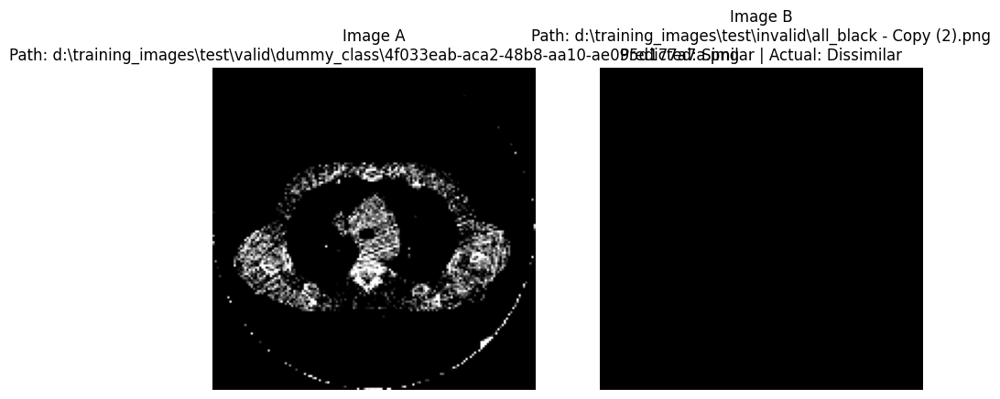

Mismatch at Index: 3177, Distance: 0.4063915014266968, Predicted Label: Similar, Actual Label: Dissimilar


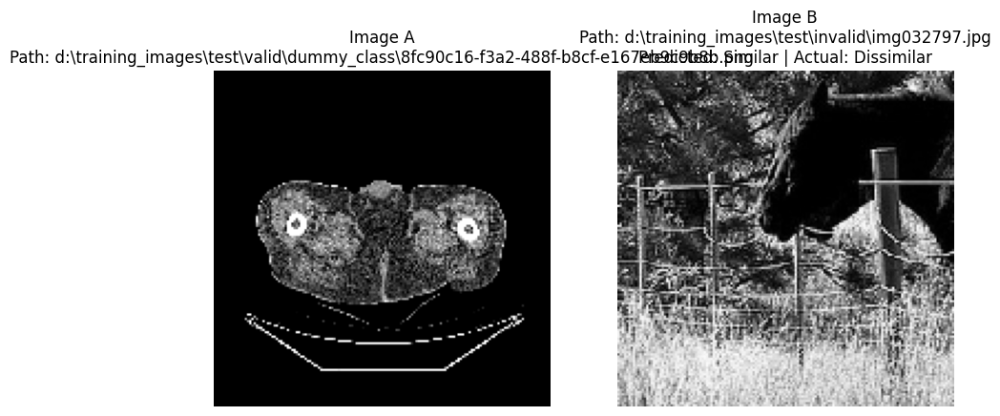

Mismatch at Index: 3293, Distance: 0.6162998676300049, Predicted Label: Similar, Actual Label: Dissimilar


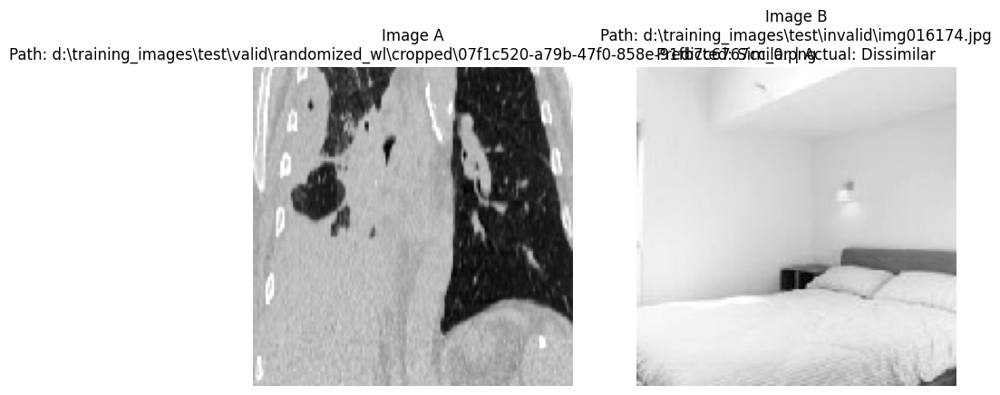

Mismatch at Index: 3350, Distance: 0.6726946234703064, Predicted Label: Dissimilar, Actual Label: Similar


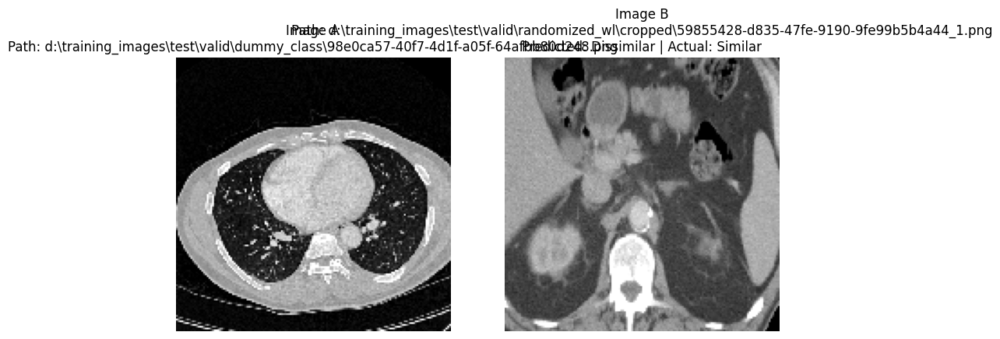

Mismatch at Index: 3394, Distance: 0.0, Predicted Label: Similar, Actual Label: Dissimilar


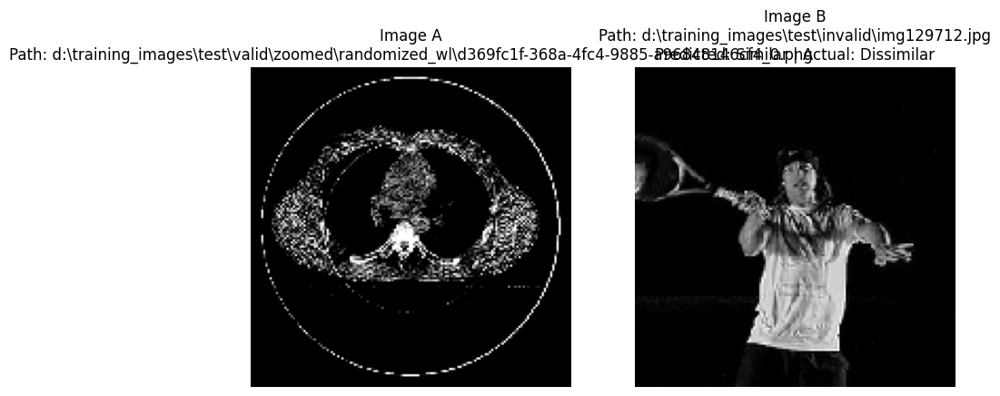

Mismatch at Index: 3610, Distance: 1.0731852054595947, Predicted Label: Dissimilar, Actual Label: Similar


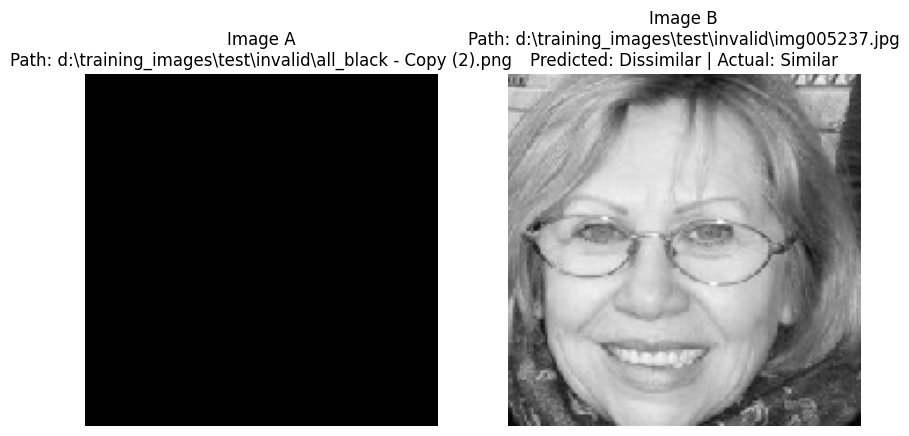

Mismatch at Index: 3635, Distance: 0.596672534942627, Predicted Label: Similar, Actual Label: Dissimilar


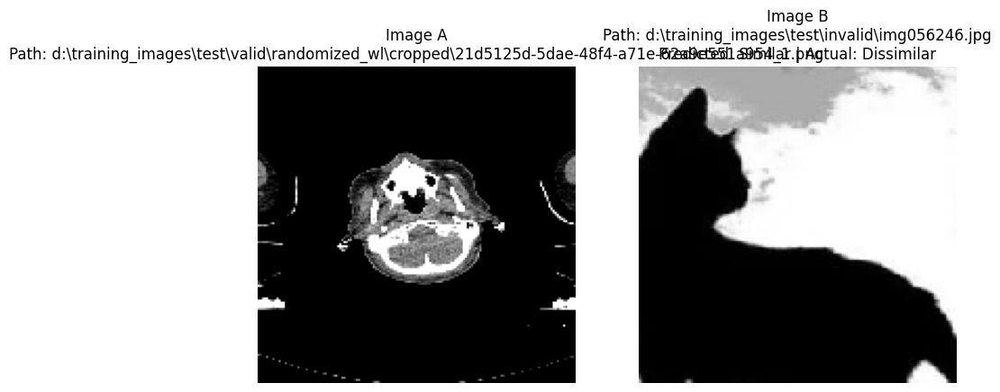

Mismatch at Index: 3718, Distance: 0.6371378302574158, Predicted Label: Dissimilar, Actual Label: Similar


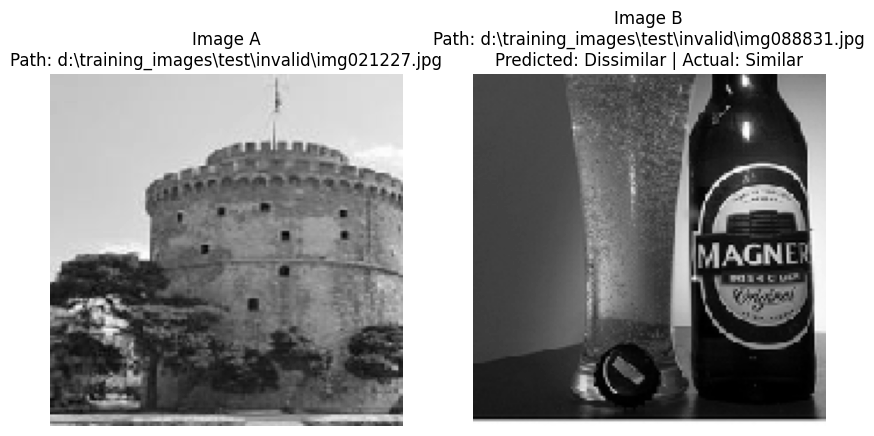

Mismatch at Index: 3828, Distance: 1.1623519659042358, Predicted Label: Dissimilar, Actual Label: Similar


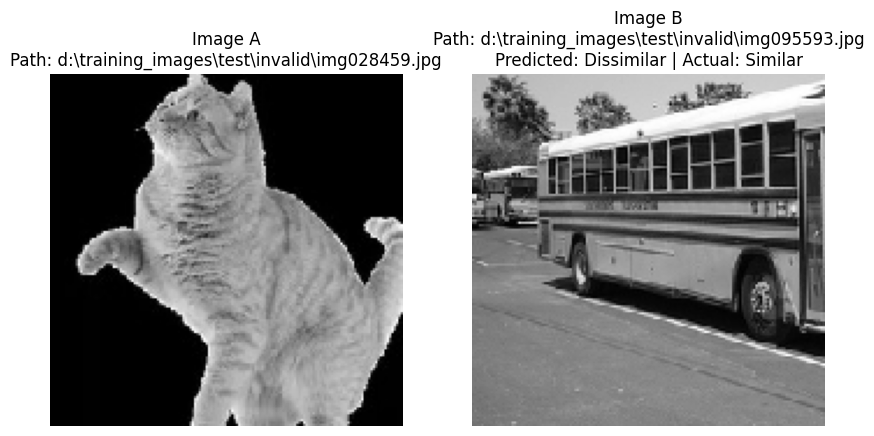

Mismatch at Index: 3910, Distance: 0.3678610920906067, Predicted Label: Similar, Actual Label: Dissimilar


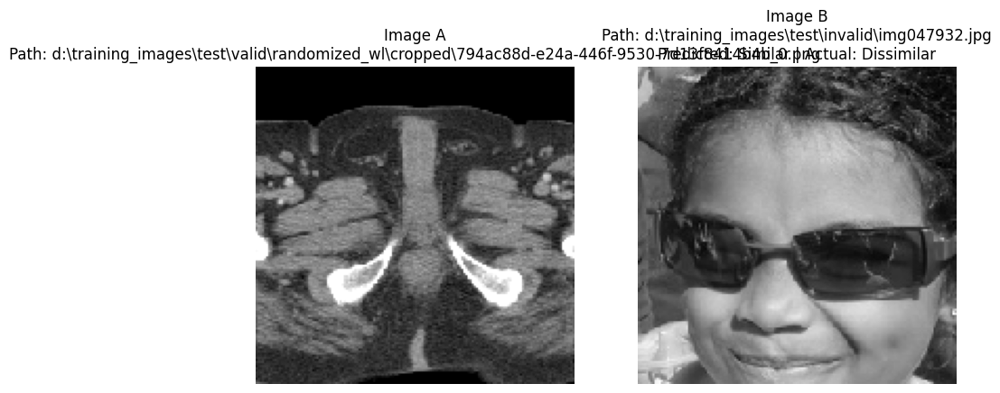

Mismatch at Index: 3931, Distance: 0.32863444089889526, Predicted Label: Similar, Actual Label: Dissimilar


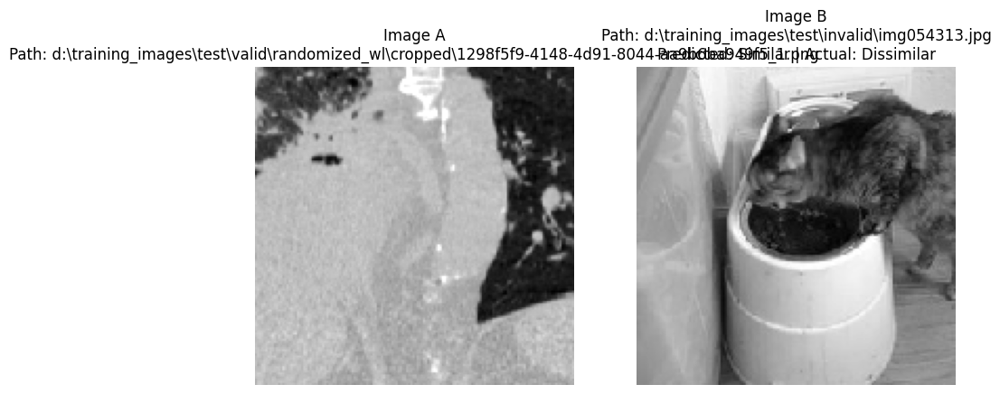

Mismatch at Index: 3980, Distance: 0.43902724981307983, Predicted Label: Similar, Actual Label: Dissimilar


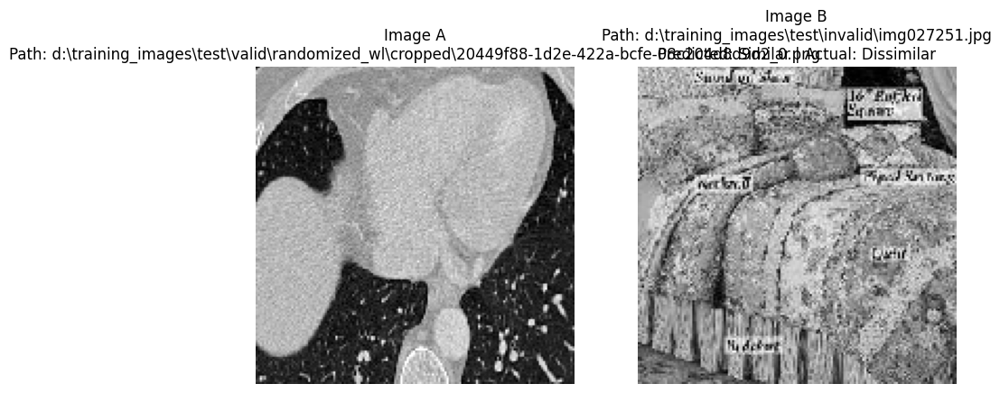

Mismatch at Index: 4071, Distance: 0.6868400573730469, Predicted Label: Dissimilar, Actual Label: Similar


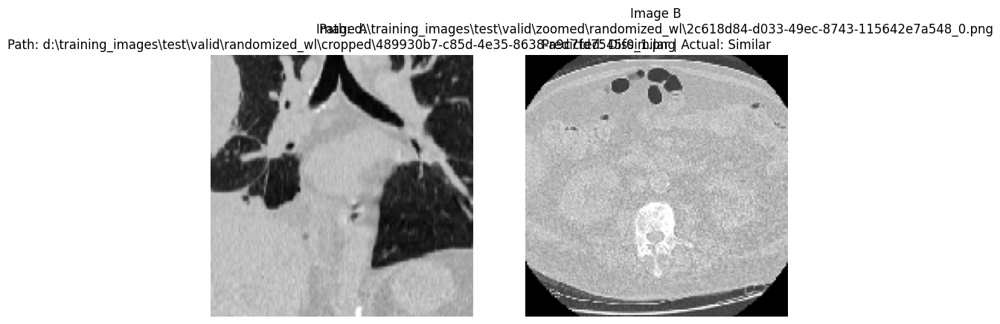

Mismatch at Index: 4139, Distance: 0.5807716846466064, Predicted Label: Similar, Actual Label: Dissimilar


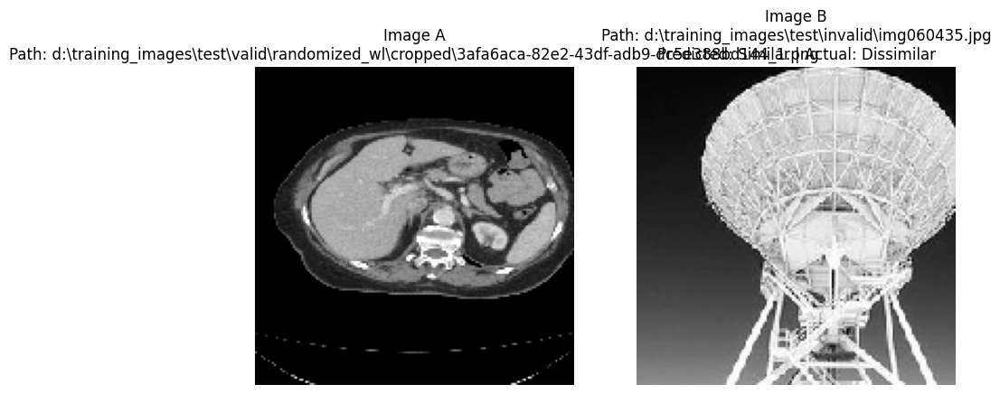

Mismatch at Index: 4140, Distance: 0.29534482955932617, Predicted Label: Similar, Actual Label: Dissimilar


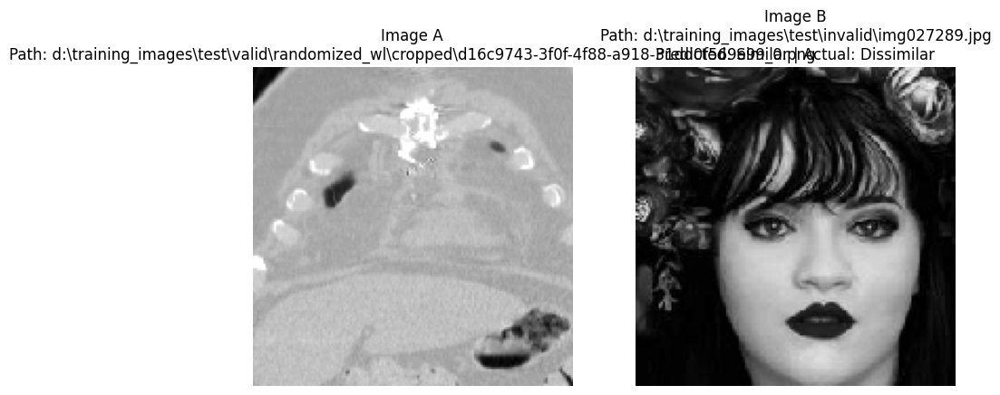

Mismatch at Index: 4148, Distance: 0.4063915014266968, Predicted Label: Similar, Actual Label: Dissimilar


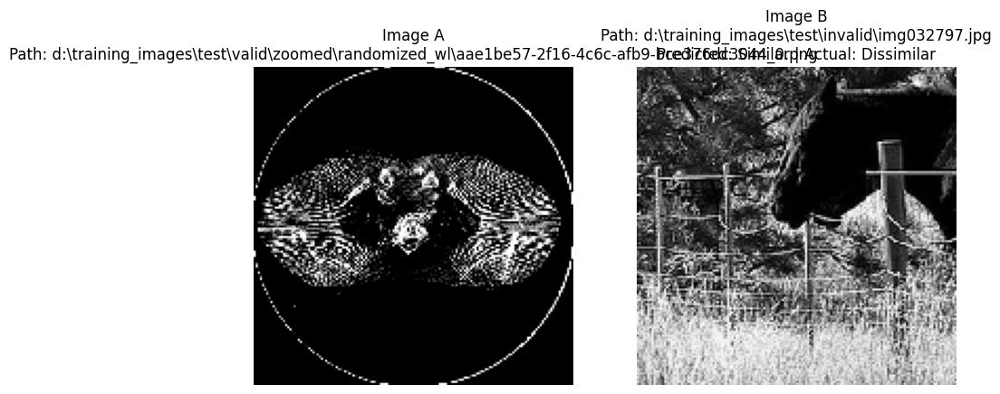

Mismatch at Index: 4157, Distance: 0.6141235828399658, Predicted Label: Similar, Actual Label: Dissimilar


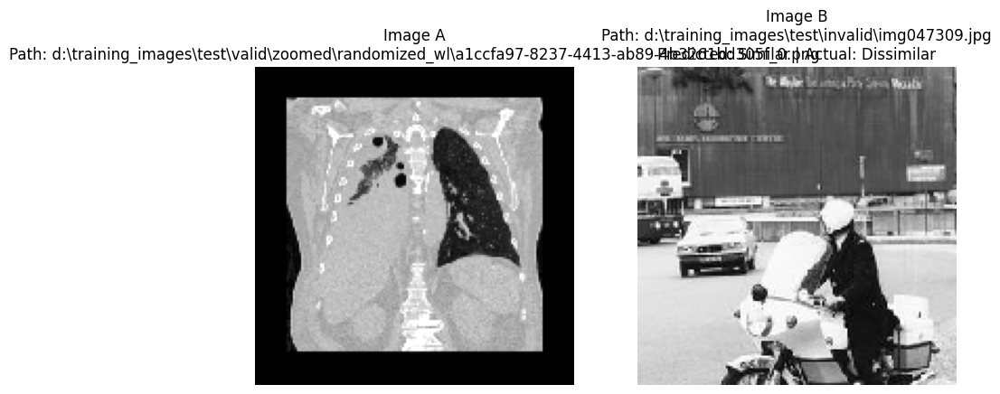

Mismatch at Index: 4201, Distance: 0.6402637958526611, Predicted Label: Dissimilar, Actual Label: Similar


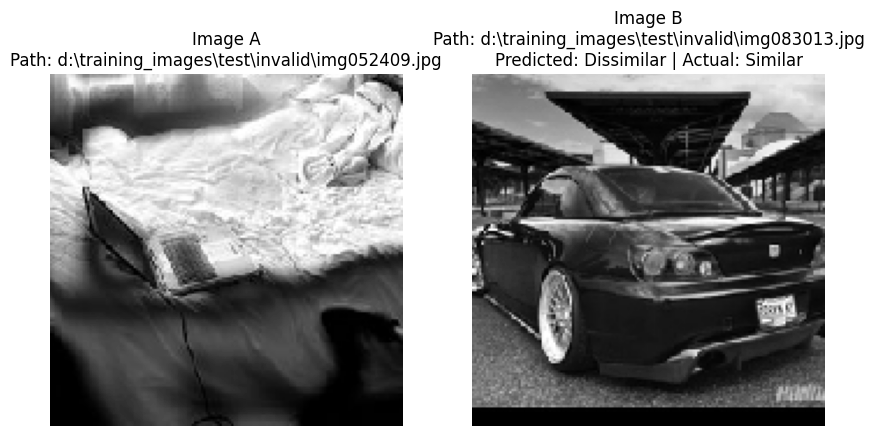

Mismatch at Index: 4226, Distance: 0.21506363153457642, Predicted Label: Similar, Actual Label: Dissimilar


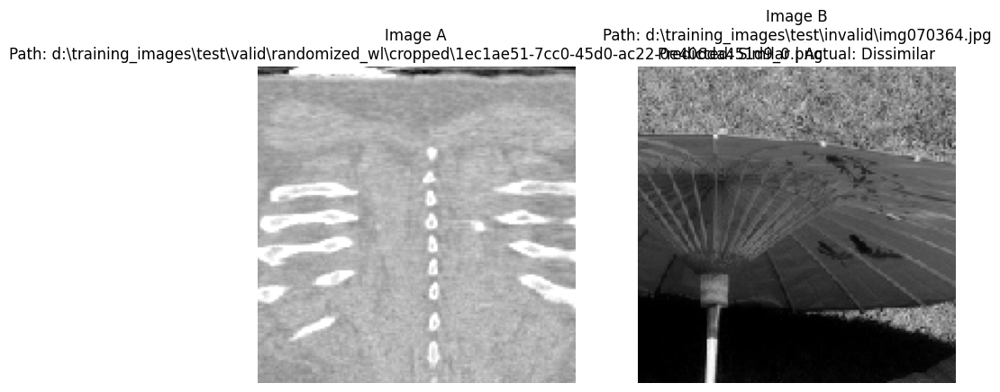

Mismatch at Index: 4262, Distance: 0.4518432021141052, Predicted Label: Similar, Actual Label: Dissimilar


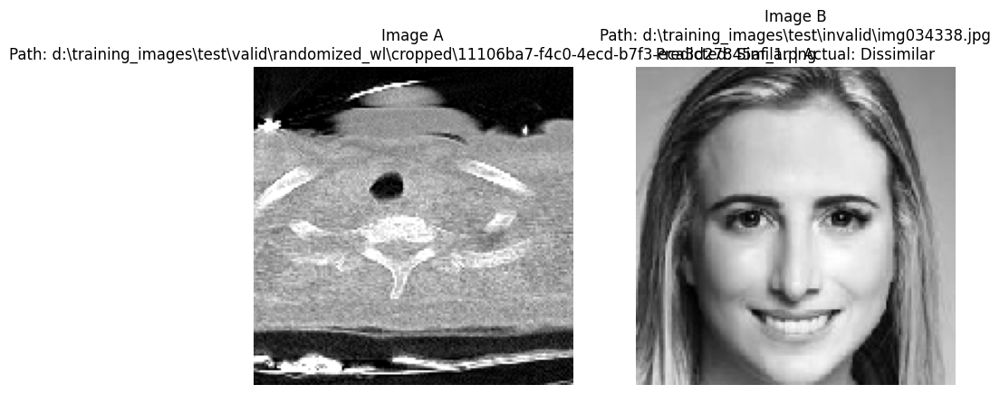

Mismatch at Index: 4306, Distance: 0.6757607460021973, Predicted Label: Dissimilar, Actual Label: Similar


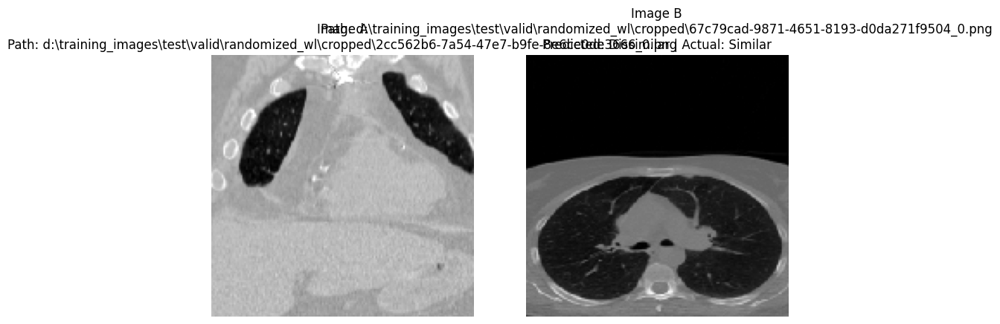

Mismatch at Index: 4314, Distance: 0.6696118116378784, Predicted Label: Dissimilar, Actual Label: Similar


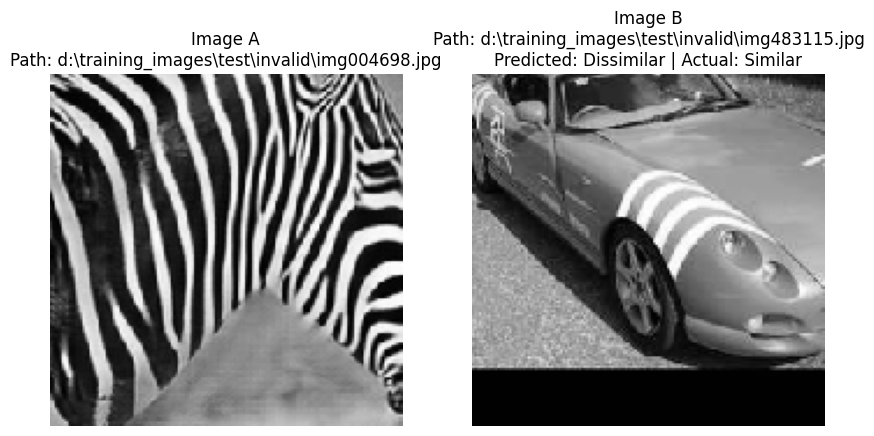

Mismatch at Index: 4458, Distance: 0.8323467373847961, Predicted Label: Dissimilar, Actual Label: Similar


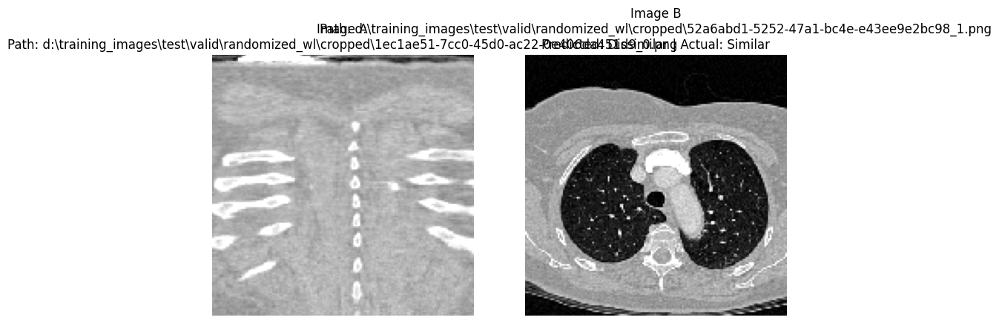

Total Mismatches: 67


In [70]:
# Example usage, assuming `pairs` is defined and contains the paths of the image pairs
plot_test_pair_mismatches_with_paths(test_images_a, test_images_b, distances, test_labels, threshold, test_pairs)

In [71]:

# Load the previously saved weights
model.load_weights(siamese_network_weights_name)